# Analysis of wavefront sensor data from ALS 5.3.1

Date: Created May 2026 · Last edited 2026-06-15

Author: Wei "Francis" He (francisho@lbl.gov, whorwhey@gmail.com)

Based on earlier versions by Dr. Antoine Islegen-Wojdyla (awojdyla@lbl.gov) and myself. 

___

## Overview

This notebook is created from the templates that designed for analyzing data taken at BL 5.3.1 via Bluesky. 

More specifically, this very script is for data taken on 2026-05-29 by Francis and Henry. 


# SETUP 

## Import 

In [16]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from tiled.client import from_uri
import os, pickle
import time

import warnings
warnings.simplefilter('always', RuntimeWarning)

In [2]:
import monoplus as mp
import wfs_live as wfl

## Access Data from the Server


__Tiled connection__

>Note: We tried read data from db with `tiled.__version__='0.2.9'`, but it failed; \
>had to reinstall a 0.2.1 version to make it work. 

In [4]:
# --- Server connection ---
api_key_path = "/Users/francisho/Documents/TILED_SINGLE_USER_API_KEY.txt"   # Change this path to where your API key is stored 

with open(api_key_path, "r") as f:
    api_key = f.read().strip()

if not api_key:
    raise ValueError("API key file is empty or not found.")

tiled_client = from_uri("http://131.243.80.226:8000", api_key=api_key)

__Dataset registry__

In [5]:
# --- Camera / objective (shared across scans) ---
# Camera / objective metadata is stored in each scan's md
# PIXEL_SIZE_M       = 2.4e-6
# OBJECTIVE_MAG      = 5
# EFF_PIXEL_M        = PIXEL_SIZE_M / OBJECTIVE_MAG    # ~0.48 µm/px

Z_GD_M             = 0.3                              # grating to detector distance (m)

# --- Dataset registry ---
# Keys: chip{N}_{grid|lin}_{tag}.  bender ranges: 'neg' = -2000:-1400 (good),
# 'zero' = -400:0 (near-zero, lower quality).  Linear: 'near' = at-chip,
# 'far' = downstream caustic.
DATASETS = {
    # ── Chip 1 (7.0 µm pitch, bcs_linear_motor ≈ 4.41 mm) ──────────────
    "chip1_grid_neg": dict(
        uid="4adb81df-534d-4fc9-8590-ab1a449e5b54",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -2000, -1400, 13),
        fixed=dict(bcs_linear_motor=4.410),
    ),
    "chip1_grid_zero": dict(
        uid="f87cf0d3-ab99-464b-81fa-73d9d892f374",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -400, 0, 9),
        fixed=dict(bcs_linear_motor=4.410),
    ),
    "chip1_lin_near": dict(
        uid="a9a6beac-9762-4cfb-939f-d5d18beb9541",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 4.410, 4.600, 191),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    "chip1_lin_far": dict(
        uid="ce368e98-65b2-4059-a954-2a2d05c21dbc",
        chip=1, grating_pitch_m=7.0e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 5.500, 5.700, 201),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    # ── Chip 2 (6.2 µm pitch, bcs_linear_motor ≈ 7.90 mm) ──────────────
    "chip2_grid_neg": dict(
        uid="5dbef69f-1e5b-43f3-8950-7118053075a1",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -2000, -1400, 13),
        fixed=dict(bcs_linear_motor=7.900),
    ),
    "chip2_grid_zero": dict(
        uid="301119ed-ad7c-4c58-b8c6-ef5c92a52115",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="grid",
        outer=("mono_energy_energy_eV", 7000, 9000, 11),
        inner=("bender_um",            -400, 0, 9),
        fixed=dict(bcs_linear_motor=7.900),
    ),
    "chip2_lin_near": dict(
        uid="a0883ecc-84b2-4096-9ee3-5f46e061a9b0",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 7.901, 8.100, 200),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
    "chip2_lin_far": dict(
        uid="67396878-25a5-459d-a6b5-cd0fe571a6f0",
        chip=2, grating_pitch_m=6.2e-6,
        scan_type="linear",
        axis=("bcs_linear_motor_mm", 8.900, 9.100, 201),
        fixed=dict(mono_energy=8000, bender_um=-2000),
    ),
}

# --- Per-chip analysis defaults (to be filled in Section B) ---
CHIP_DEFAULTS = {
    1: dict(y_roi=None, tilt_rad=None, V_threshold=0.4, I0_threshold=0.02),
    2: dict(y_roi=None, tilt_rad=None, V_threshold=0.4, I0_threshold=0.02),
}

for k, d in DATASETS.items():
    print(f"{k:20s}  chip={d['chip']}  pitch={d['grating_pitch_m']*1e6:.1f} µm  "
          f"{d['scan_type']:6s}  uid={d['uid'][:]}")

chip1_grid_neg        chip=1  pitch=7.0 µm  grid    uid=4adb81df-534d-4fc9-8590-ab1a449e5b54
chip1_grid_zero       chip=1  pitch=7.0 µm  grid    uid=f87cf0d3-ab99-464b-81fa-73d9d892f374
chip1_lin_near        chip=1  pitch=7.0 µm  linear  uid=a9a6beac-9762-4cfb-939f-d5d18beb9541
chip1_lin_far         chip=1  pitch=7.0 µm  linear  uid=ce368e98-65b2-4059-a954-2a2d05c21dbc
chip2_grid_neg        chip=2  pitch=6.2 µm  grid    uid=5dbef69f-1e5b-43f3-8950-7118053075a1
chip2_grid_zero       chip=2  pitch=6.2 µm  grid    uid=301119ed-ad7c-4c58-b8c6-ef5c92a52115
chip2_lin_near        chip=2  pitch=6.2 µm  linear  uid=a0883ecc-84b2-4096-9ee3-5f46e061a9b0
chip2_lin_far         chip=2  pitch=6.2 µm  linear  uid=67396878-25a5-459d-a6b5-cd0fe571a6f0


## Helper Functions

Two utilities used throughout the rest of the notebook:

- **`load_scan(key)`** — pull a registered scan from Tiled. Returns `(images, meta, info)`, where `meta` is a dict of per-frame 1-D arrays (`mono_energy_eV`, `bender_um`, or `bcs_linear_motor_mm` depending on `scan_type`) and `info` carries the resolved shape and registry metadata.
- **`frame_label(key, idx, meta, info)`** — formatted string for plot titles and log lines, e.g. `"chip1_grid_neg (chip1)  idx=67  E=8000 eV  B=-1900 µm"`.

In [6]:
def load_scan(key, verbose=True):
    """Load a registered scan from Tiled.

    Returns
    -------
    images : (N, H, W) ndarray
    meta   : dict[str, ndarray]   per-frame scanned variable(s)
    info   : dict                 registry entry + resolved shape, dx_m
    """
    if key not in DATASETS:
        raise KeyError(f"{key!r} not in DATASETS. Keys: {list(DATASETS)}")
    info = dict(DATASETS[key])
    db   = tiled_client[info["uid"]]

    images = db["primary"]["basler_5472_image"].read()
    if images.ndim == 4 and images.shape[1] == 1:
        images = images[:, 0]

    # Effective pixel size from start metadata (varies with binning + objective)
    try:
        dx_m = float(db.metadata["start"]["effective pixel size [um]"]) * 1e-6
        info["dx_source"] = "metadata"
    except KeyError:
        # TEMP: linear scans on 2026-05-29 were taken without md=md, so start
        # metadata is missing camera/binning fields. Hardcoded from the scan
        # notebook: basler_5472, bin=1×1, 2.4 µm pixel, Mitutoyo 5× → 0.48 µm/px.
        # Remove once all scans carry full md.
        dx_m = 0.48e-6
        info["dx_source"] = "fallback (hardcoded; see load_scan TEMP block)"
        if verbose:
            print(f"[{key}]  dx_m fallback: {dx_m*1e6:.3f} µm/px (md missing)")
    info["dx_m"] = dx_m

    primary = db["primary"]
    avail   = list(primary)
    meta    = {}

    def _pull(stem_options):
        for k in stem_options:
            if k in avail:
                return np.asarray(primary[k].read())
        return None

    if info["scan_type"] == "grid":
        E = _pull(["mono_energy_energy_eV", "mono_energy"])
        B = _pull(["bender_um", "Obender", "Obender_um"])
        if E is None or B is None:
            raise KeyError(f"grid metadata not found.  primary keys: {avail}")
        meta["mono_energy_eV"] = E
        meta["bender_um"]      = B
        info["shape"]          = (info["outer"][3], info["inner"][3])

    elif info["scan_type"] == "linear":
        lm = _pull(["bcs_linear_motor", "bcs_linear_motor_mm",
                    "bcs_linear_motor_user_setpoint",
                    "bcs_linear_motor_user_readback"])
        if lm is None:
            raise KeyError(f"linear-motor metadata not found.  primary keys: {avail}")
        meta["bcs_linear_motor_mm"] = lm
        info["shape"] = (info["axis"][3],)

    info["n_frames"] = images.shape[0]
    info["image_hw"] = images.shape[1:]

    if verbose:
        print(f"[{key}]  images {images.shape}  dx={dx_m*1e6:.3f} µm  "
              f"meta keys: {list(meta)}  shape={info['shape']}")
    return images, meta, info

In [7]:
def frame_label(key, idx, meta=None, info=None):
    """Human-readable label for plot titles, log lines, etc.

    Convention: fixed values inside (...), per-frame values outside.
    """
    d = DATASETS[key]
    fixed, scanned = [], [f"idx={idx}"]

    # mono_energy
    if meta is not None and "mono_energy_eV" in meta:
        scanned.append(f"E={meta['mono_energy_eV'][idx]:.0f} eV")
    elif "mono_energy" in d["fixed"]:
        fixed.append(f"E={d['fixed']['mono_energy']:.0f} eV")

    # bender
    if meta is not None and "bender_um" in meta:
        scanned.append(f"bender={meta['bender_um'][idx]:+.0f} µm")
    elif "bender_um" in d["fixed"]:
        fixed.append(f"bender={d['fixed']['bender_um']:+.0f} µm")

    # linear motor
    if meta is not None and "bcs_linear_motor_mm" in meta:
        scanned.append(f"l={meta['bcs_linear_motor_mm'][idx]:.3f} mm")
    elif "bcs_linear_motor" in d["fixed"]:
        fixed.append(f"l={d['fixed']['bcs_linear_motor']:.3f} mm")

    head = f"{key} ({', '.join(fixed)})" if fixed else key
    return "  ".join([head, *scanned])

In [8]:
SCANS = {}

def get_scan(key):
    """Cached load_scan. Repeated calls return the same (images, meta, info)."""
    if key not in SCANS:
        SCANS[key] = load_scan(key)
    return SCANS[key]

# PRE-PROCESSING

Two coding issues need resolving before bulk processing:
1. **fringe tilt.** Fringes are not exactly parallel to the y-axis. 
2. **V-threshold mask.** The trust_mask drops the wrong region on idx=67. 

## Chip 1 Santiy

### Load data and preview

In [177]:
# Load a scan (slow, ~1-2 mins)
images, meta, info = load_scan("chip1_grid_neg")


[chip1_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)


chip1_grid_neg (l=4.410 mm)  idx=65  E=8000 eV  bender=-2000 µm


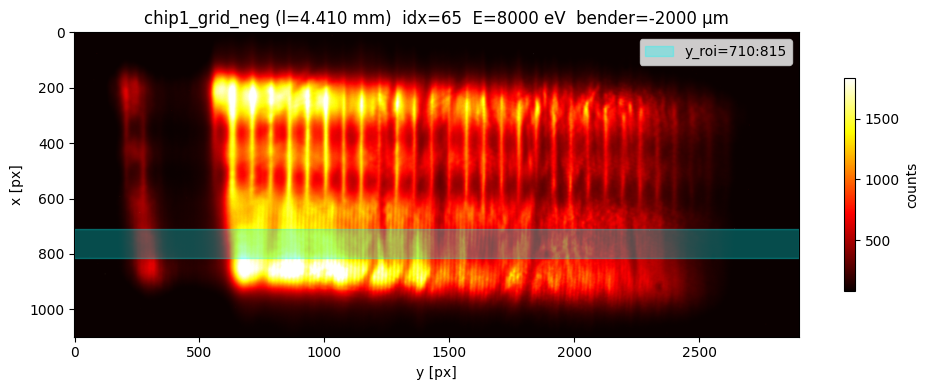

In [212]:
idx = 65
print(frame_label("chip1_grid_neg", idx, meta, info))

plt.figure(figsize=(10, 4))
plt.imshow(images[idx].T, cmap="hot", aspect="auto",
           vmin=np.percentile(images[idx],25), vmax=np.percentile(images[idx], 99.5))
plt.axhspan(710, 815, color="cyan", alpha=0.3, label="y_roi=710:815")
plt.title(frame_label("chip1_grid_neg", idx, meta, info))
plt.xlabel("y [px]"); plt.ylabel("x [px]")
plt.colorbar(label="counts", shrink=0.7)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### `y_roi` width search 



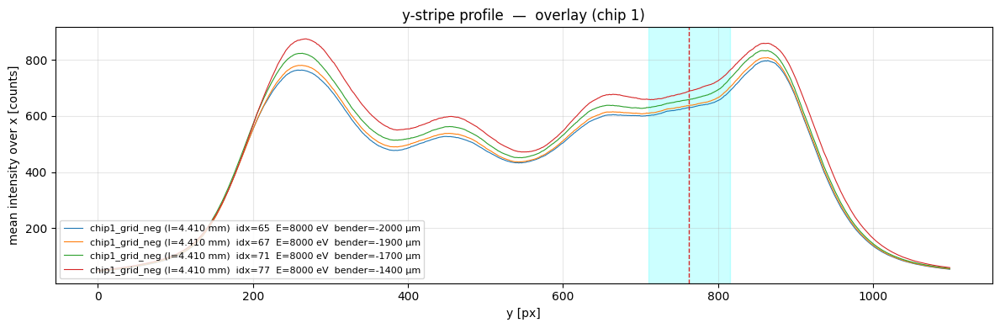

In [211]:
# Brightest-stripe location along y (= axis 1 of images[idx])
idx_list = [65, 67, 71, 77]

plt.figure(figsize=(12, 4))
for idx in idx_list:
    profile_y = images[idx].mean(axis=0)
    N_y_total = images[idx].shape[1]
    plt.plot(np.arange(N_y_total), profile_y, lw=0.8,
             label=frame_label('chip1_grid_neg', idx, meta, info))

plt.axvline(762.5, color='C3', ls='--', lw=1)
plt.axvspan(710, 815, color='cyan', alpha=0.2)
plt.xlabel('y [px]'); plt.ylabel('mean intensity over x [counts]')
plt.title("y-stripe profile  —  overlay (chip 1)")
plt.legend(loc='lower left', fontsize=8)
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

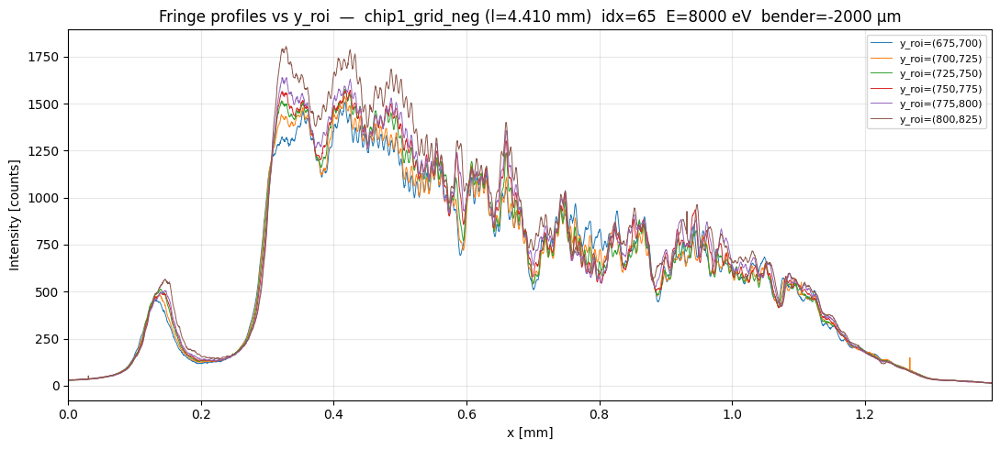

In [217]:
y_candidates = [(675, 700), (700, 725), (725, 750),
                (750, 775), (775, 800), (800, 825)]
idx = 65
x_mm = np.arange(images[idx].shape[0]) * info["dx_m"] * 1e3

plt.figure(figsize=(11, 5))
for (y0, y1) in y_candidates:
    prof = images[idx][:, y0:y1].mean(axis=1)
    plt.plot(x_mm, prof, lw=0.7, label=f"y_roi=({y0},{y1})")
plt.xlabel("x [mm]"); plt.ylabel("Intensity [counts]")
plt.xlim(x_mm[0], x_mm[-1])
plt.title(f"Fringe profiles vs y_roi  —  {frame_label('chip1_grid_neg', idx, meta, info)}")
plt.legend(fontsize=8, loc="upper right")
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

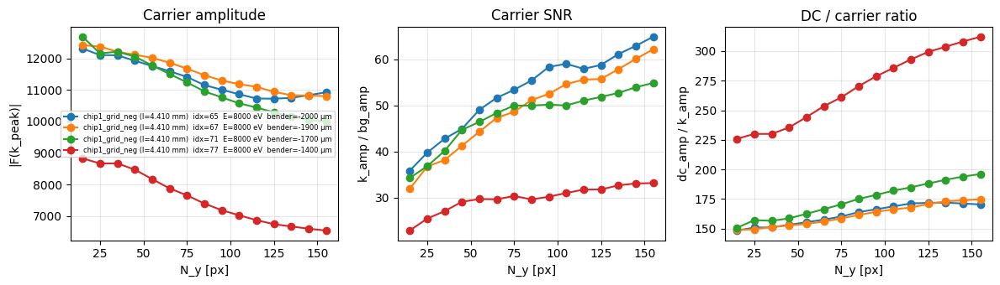

N_y sweep — chip1_grid_neg (l=4.410 mm)  idx=65  E=8000 eV  bender=-2000 µm
 N_y         y_roi       k_amp      snr     dc/k  k_pk[c/mm]
----------------------------------------------------------------
  15    (755, 770)    1.23e+04     35.9   148.34      135.06
  25    (750, 775)    1.21e+04     39.7   150.87      135.06
  35    (745, 780)    1.21e+04     42.8   150.98      135.06
  45    (740, 785)    1.19e+04     44.9   153.18      135.06
  55    (735, 790)    1.18e+04     49.0   155.36      135.06
  65    (730, 795)    1.16e+04     51.6   157.60      135.06
  75    (725, 800)    1.14e+04     53.4   160.13      135.06
  85    (720, 805)    1.12e+04     55.4   163.90      135.06
  95    (715, 810)    1.10e+04     58.3   166.28      135.06
 105    (710, 815)    1.09e+04     59.0   168.73      135.06
 115    (705, 820)    1.07e+04     57.9   171.22      134.34
 125    (700, 825)    1.07e+04     58.7   171.77      134.34
 135    (695, 830)    1.07e+04     61.1   171.93      134.34
 145 

In [184]:
# Half-open slice [a, a+N_y) centered at 762.5 ⇒ a = (1525 - N_y) // 2  (odd N_y)
N_y_list = list(range(15, 156, 10))

records_by_idx = {}
for idx in idx_list:
    records = []
    for N_y in N_y_list:
        a = (1525 - N_y) // 2
        y_roi = slice(a, a + N_y)
        profile = wfl.extract_profile(images[idx], y_roi, axis=1)
        car = wfl.find_carrier(profile, dx=info["dx_m"],
                               grating_pitch=info["grating_pitch_m"])
        records.append(dict(
            N_y         = N_y,
            y_roi       = (y_roi.start, y_roi.stop),
            k_peak      = car["k_peak"],
            k_amp       = car["k_amp"],
            dc_amp      = car["dc_amp"],
            bg_amp      = car["bg_amp"],
            carrier_snr = car["k_amp"] / car["bg_amp"],
            dc_ratio    = car["dc_amp"] / car["k_amp"],
        ))
    records_by_idx[idx] = records

# Plot
fig, axes = plt.subplots(1, 3, figsize=(12, 3.5))
for idx in idx_list:
    records = records_by_idx[idx]
    N_arr = np.array([r['N_y'] for r in records])
    label = frame_label('chip1_grid_neg', idx, meta, info)
    axes[0].plot(N_arr, [r['k_amp']       for r in records], 'o-', label=label)
    axes[1].plot(N_arr, [r['carrier_snr'] for r in records], 'o-', label=label)
    axes[2].plot(N_arr, [r['dc_ratio']    for r in records], 'o-', label=label)

axes[0].set_xlabel('N_y [px]'); axes[0].set_ylabel('|F(k_peak)|')
axes[0].set_title('Carrier amplitude'); axes[0].grid(alpha=0.3)
axes[1].set_xlabel('N_y [px]'); axes[1].set_ylabel('k_amp / bg_amp')
axes[1].set_title('Carrier SNR'); axes[1].grid(alpha=0.3)
axes[2].set_xlabel('N_y [px]'); axes[2].set_ylabel('dc_amp / k_amp')
axes[2].set_title('DC / carrier ratio'); axes[2].grid(alpha=0.3)
axes[0].legend(fontsize=6)
plt.tight_layout(); plt.show()

# Tables
for idx in idx_list:
    records = records_by_idx[idx]
    print(f"N_y sweep — {frame_label('chip1_grid_neg', idx, meta, info)}")
    print(f"{'N_y':>4}  {'y_roi':>12}  {'k_amp':>10}  {'snr':>7}  {'dc/k':>7}  {'k_pk[c/mm]':>10}")
    print("-" * 64)
    for r in records:
        print(f"{r['N_y']:4d}  {str(r['y_roi']):>12}  "
              f"{r['k_amp']:10.2e}  {r['carrier_snr']:7.1f}  "
              f"{r['dc_ratio']:7.2f}  {r['k_peak']*1e-3:10.2f}")
    print()

### Tilt characterization



k_ideal = 142.86 cyc/mm  (chip 1, p=7.0 µm)
       x_crop   center    ky_pos    ky_neg    cx_pos    cx_neg     tilt
------------------------------------------------------------------------------
  ( 685, 790)    737.5   +133.68   -133.68    +2.457    -2.457   +1.053
  ( 690, 795)    742.5   +133.68   -133.68    +1.783    -1.783   +0.764
  ( 695, 800)    747.5   +133.68   -133.68    +3.847    -3.847   +1.648
  ( 700, 805)    752.5   +133.68   -133.68    +4.788    -4.788   +2.051
  ( 705, 810)    757.5   +133.68   -133.68    +3.885    -3.885   +1.665
  ( 710, 815)    762.5   +133.68   -133.68    +2.604    -2.604   +1.116
  ( 715, 820)    767.5   +133.68   -133.68    +3.070    -3.070   +1.315
  ( 720, 825)    772.5   +133.68   -133.68    +3.869    -3.869   +1.658
  ( 725, 830)    777.5   +133.68   -133.68    +2.694    -2.694   +1.154
  ( 730, 835)    782.5   +133.68   -133.68    +2.469    -2.469   +1.058
  ( 735, 840)    787.5   +133.68   -133.68    +3.099    -3.099   +1.328


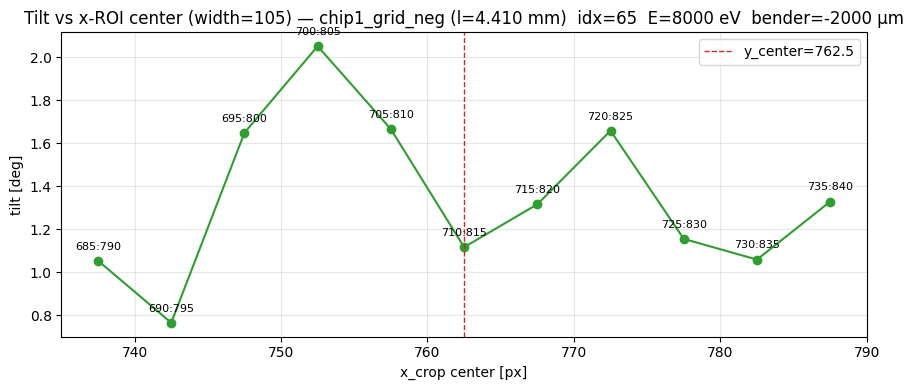

In [189]:
from numpy.fft import fft2, fftshift, fftfreq

idx_tilt = 65
y_crop   = slice(500, 1700)

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

centers     = np.arange(737.5, 787.51, 5)                  # ±25 around y_center=762.5
x_crop_list = [(int(c - 52.5), int(c + 52.5)) for c in centers]

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 1, p=7.0 µm)")
print(f"{'x_crop':>13}  {'center':>7}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_center = []
for (x0, x1), c in zip(x_crop_list, centers):
    crop = images[idx_tilt][y_crop, slice(x0, x1)].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_center.append(dict(
        x_crop=(x0, x1), x_center=c,
        ky_pos=ky_pos, ky_neg=ky_neg, cx_pos=cx_pos, cx_neg=cx_neg,
        tilt_deg=np.degrees(tilt_rad)))

    print(f"  ({x0:>4},{x1:>4})  {c:7.1f}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

xs   = [r['x_center'] for r in tilt_records_center]
ts   = [r['tilt_deg'] for r in tilt_records_center]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_center]

plt.figure(figsize=(9, 4))
plt.plot(xs, ts, 'o-', color='C2')
for c, t, lab in zip(xs, ts, lbls):
    plt.annotate(lab, (c, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.axvline(762.5, color='C3', ls='--', lw=1, label='y_center=762.5')
plt.xlabel('x_crop center [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI center (width=105) — "
          f"{frame_label('chip1_grid_neg', idx_tilt, meta, info)}")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

center_locked = 762.5
       x_crop   width    ky_pos    ky_neg    cx_pos    cx_neg     tilt
------------------------------------------------------------------------------
  ( 750, 775)      25   +133.68   -133.68    +0.684    -0.684   +0.293
  ( 745, 780)      35   +133.68   -133.68    +2.956    -2.956   +1.267
  ( 740, 785)      45   +133.68   -133.68    +5.709    -5.709   +2.445
  ( 735, 790)      55   +133.68   -133.68    +5.829    -5.829   +2.497
  ( 730, 795)      65   +133.68   -133.68    +6.192    -6.192   +2.652
  ( 725, 800)      75   +133.68   -133.68    +5.640    -5.640   +2.416
  ( 720, 805)      85   +133.68   -133.68    +5.008    -5.008   +2.145
  ( 715, 810)      95   +133.68   -133.68    +4.335    -4.335   +1.857
  ( 710, 815)     105   +133.68   -133.68    +2.604    -2.604   +1.116
  ( 705, 820)     115   +133.68   -133.68    +1.513    -1.513   +0.648
  ( 700, 825)     125   +133.68   -133.68    +3.309    -3.309   +1.418
  ( 695, 830)     135   +133.68   -133.68    +4

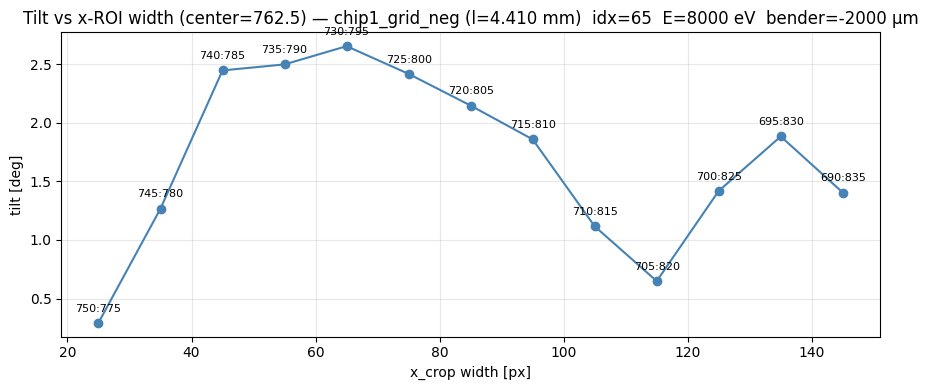

In [214]:
center_locked = 762.5                              # ← update from cell 1
N_y_list_w    = list(range(25, 146, 10))           # 25, 35, ..., 145

x_crop_list_w = [(int(round(center_locked - N/2)), int(round(center_locked + N/2)))
                 for N in N_y_list_w]

print(f"center_locked = {center_locked}")
print(f"{'x_crop':>13}  {'width':>6}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_width = []
for (x0, x1) in x_crop_list_w:
    crop = images[idx_tilt][y_crop, slice(x0, x1)].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_width.append(dict(
        x_crop=(x0, x1), width=x1-x0,
        ky_pos=ky_pos, ky_neg=ky_neg, cx_pos=cx_pos, cx_neg=cx_neg,
        tilt_deg=np.degrees(tilt_rad)))

    print(f"  ({x0:>4},{x1:>4})  {x1-x0:6d}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

ws   = [r['width']    for r in tilt_records_width]
ts   = [r['tilt_deg'] for r in tilt_records_width]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_width]

plt.figure(figsize=(9, 4))
plt.plot(ws, ts, 'o-', color='steelblue')
for w, t, lab in zip(ws, ts, lbls):
    plt.annotate(lab, (w, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.xlabel('x_crop width [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI width (center={center_locked}) — "
          f"{frame_label('chip1_grid_neg', idx_tilt, meta, info)}")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

x_crop = (710, 815)  width=105

 idx    ky_pos    ky_neg    cx_pos    cx_neg     tilt
------------------------------------------------------------
    65   +133.68   -133.68    +2.604    -2.604   +1.116
    66   +133.68   -133.68    +1.210    -1.210   +0.519
    67   +133.68   -133.68    +2.003    -2.003   +0.858
    68   +133.68   -133.68    +5.292    -5.292   +2.267
    69   +133.68   -133.68    +5.401    -5.401   +2.314
    70   +131.94   -131.94    +3.949    -3.949   +1.714
    71   +131.94   -131.94    +4.561    -4.561   +1.980
    72   +130.21   -130.21    +1.337    -1.337   +0.588
    73   +130.21   -130.21    +2.857    -2.857   +1.257
    74   +126.74   -126.74    +5.393    -5.393   +2.436
    75   +126.74   -126.74    +5.629    -5.629   +2.543
    76   +135.42   -135.42    -0.205    +0.205   -0.087
    77   +131.94   -131.94    +2.299    -2.299   +0.998


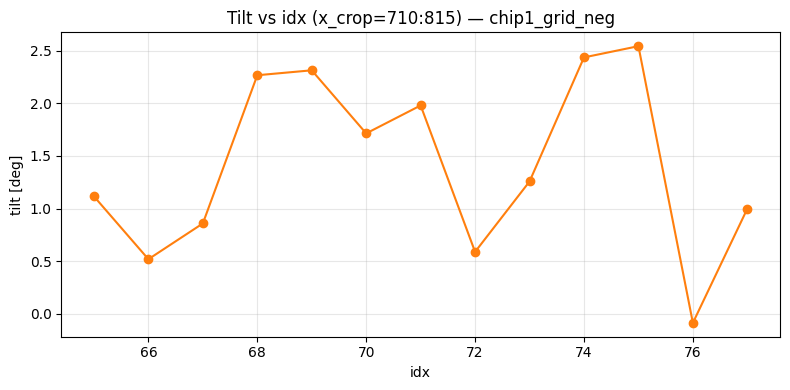

In [215]:
x_crop_locked = slice(710, 815)                    # ← update from cells 1+2
idx_sweep     = list(range(65, 78))                # 65..77

print(f"x_crop = ({x_crop_locked.start}, {x_crop_locked.stop})  "
      f"width={x_crop_locked.stop - x_crop_locked.start}\n")
print(f"{'idx':>4}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 60)

tilt_records_idx = []
for idx in idx_sweep:
    crop = images[idx][y_crop, x_crop_locked].astype(float)
    crop -= crop.mean()
    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0 = np.argmin(np.abs(kx_ax))
    ky_cut = aF[:, ix0]
    bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
    ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
    cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_idx.append(dict(
        idx=idx, ky_pos=ky_pos, ky_neg=ky_neg,
        cx_pos=cx_pos, cx_neg=cx_neg, tilt_deg=np.degrees(tilt_rad)))

    print(f"  {idx:4d}  {ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

idxs = [r['idx']      for r in tilt_records_idx]
ts   = [r['tilt_deg'] for r in tilt_records_idx]

plt.figure(figsize=(8, 4))
plt.plot(idxs, ts, 'o-', color='C1')
plt.xlabel('idx'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs idx (x_crop={x_crop_locked.start}:{x_crop_locked.stop}) — chip1_grid_neg")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

k_ideal = 142.86 cyc/mm  (chip 1, p=7.0 µm)
x_crop  = (710, 815)  width=105
ky_pos  = +133.68    ky_neg = -133.68  cyc/mm
cx_pos  = +2.604     cx_neg = -2.604   cyc/mm

tilt   = +1.116 deg


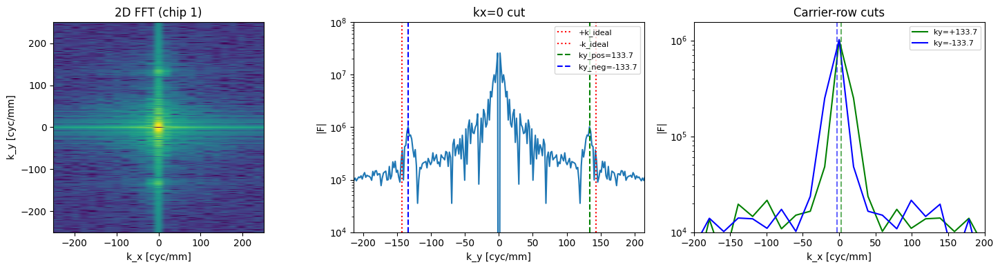

In [216]:
crop = images[idx_tilt][y_crop, x_crop_locked].astype(float)
crop -= crop.mean()

F  = fftshift(fft2(crop)); aF = np.abs(F)
nyc, nxc = crop.shape
ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

ix0 = np.argmin(np.abs(kx_ax))
ky_cut = aF[:, ix0]
bp = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
bn = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
ky_pos = ky_ax[bp][np.argmax(ky_cut[bp])]
ky_neg = ky_ax[bn][np.argmax(ky_cut[bn])]
iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
win = np.abs(kx_ax) < 100e3
cx_pos = centroid(kx_ax[win], aF[iy_pos][win])
cx_neg = centroid(kx_ax[win], aF[iy_neg][win])
tilt_rad_chip1 = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 1, p=7.0 µm)")
print(f"x_crop  = ({x_crop_locked.start}, {x_crop_locked.stop})  "
      f"width={x_crop_locked.stop - x_crop_locked.start}")
print(f"ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
print(f"cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
print(f"\ntilt   = {np.degrees(tilt_rad_chip1):+.3f} deg")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ext = [kx_ax.min()*1e-3, kx_ax.max()*1e-3, ky_ax.min()*1e-3, ky_ax.max()*1e-3]
axes[0].imshow(np.log10(aF + 1), origin="lower", aspect="equal",
               extent=ext, cmap="viridis", vmin=3, vmax=7)
axes[0].set_xlim(-250, 250); axes[0].set_ylim(-250, 250)
axes[0].set_xlabel("k_x [cyc/mm]"); axes[0].set_ylabel("k_y [cyc/mm]")
axes[0].set_title("2D FFT (chip 1)")

axes[1].semilogy(ky_ax*1e-3, ky_cut)
for k, c, lab in [( k_ideal, "r", "+k_ideal"),
                  (-k_ideal, "r", "-k_ideal"),
                  ( ky_pos, "g", f"ky_pos={ky_pos*1e-3:.1f}"),
                  ( ky_neg, "b", f"ky_neg={ky_neg*1e-3:.1f}")]:
    axes[1].axvline(k*1e-3, color=c, ls="--" if "ky" in lab else ":", label=lab)
axes[1].set_xlim(-1.5*k_ideal*1e-3, 1.5*k_ideal*1e-3)
axes[1].set_ylim(1e4, 1e8)
axes[1].set_xlabel("k_y [cyc/mm]"); axes[1].set_ylabel("|F|")
axes[1].set_title("kx=0 cut"); axes[1].legend(fontsize=8)

axes[2].semilogy(kx_ax*1e-3, aF[iy_pos], color="g", label=f"ky={ky_pos*1e-3:+.1f}")
axes[2].semilogy(kx_ax*1e-3, aF[iy_neg], color="b", label=f"ky={ky_neg*1e-3:+.1f}")
axes[2].axvline(cx_pos*1e-3, color="g", ls="--", alpha=0.6)
axes[2].axvline(cx_neg*1e-3, color="b", ls="--", alpha=0.6)
axes[2].set_xlim(-200, 200); axes[2].set_ylim(bottom=1e4)
axes[2].set_xlabel("k_x [cyc/mm]"); axes[2].set_ylabel("|F|")
axes[2].set_title("Carrier-row cuts"); axes[2].legend(fontsize=8)
plt.tight_layout(); plt.show()

### Lock `y_roi_chip1` 


In [218]:
y_roi_chip1 = slice(710, 815)     # N_y=105, center 762.5
print(f"chip-1 y_roi locked: slice({y_roi_chip1.start}, {y_roi_chip1.stop})  "
      f"width={y_roi_chip1.stop - y_roi_chip1.start}  "
      f"center={(y_roi_chip1.start + y_roi_chip1.stop)/2}")

chip-1 y_roi locked: slice(710, 815)  width=105  center=762.5


### Trust_mask β-fix (archived)

[  ok]  λ=0.15nm  k_peak=135.1 cyc/mm  r_DC=150.9  SNR=39.7  f_pred=-5.66m  RMS_W=10.2nm  RMS_resid=0.092nm


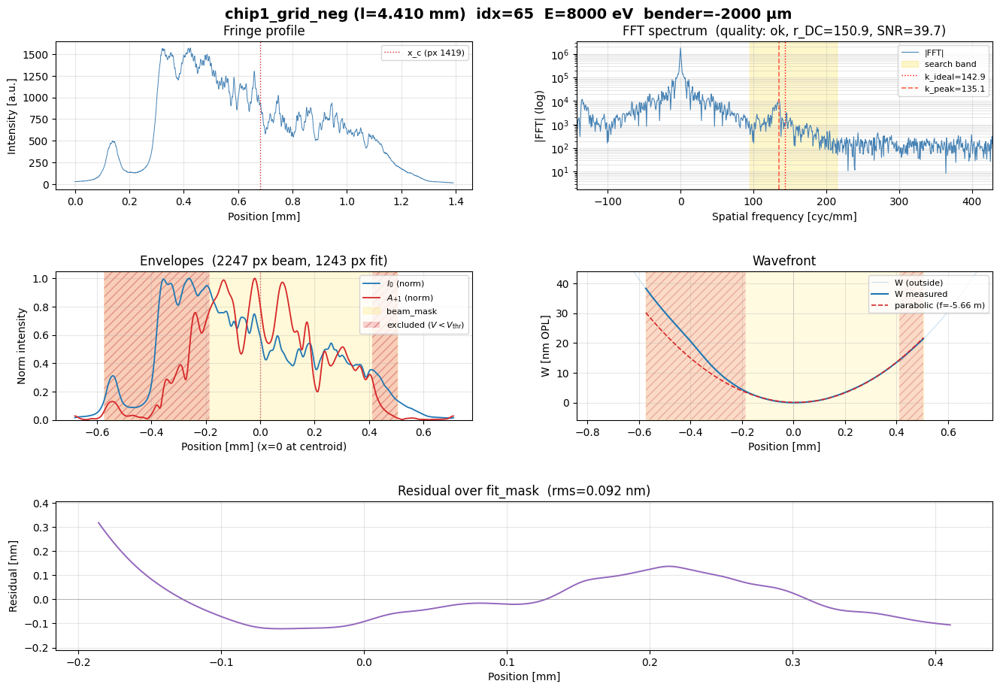

[  ok]  λ=0.15nm  k_peak=134.3 cyc/mm  r_DC=149.4  SNR=36.7  f_pred=-5.40m  RMS_W=9.9nm  RMS_resid=0.082nm


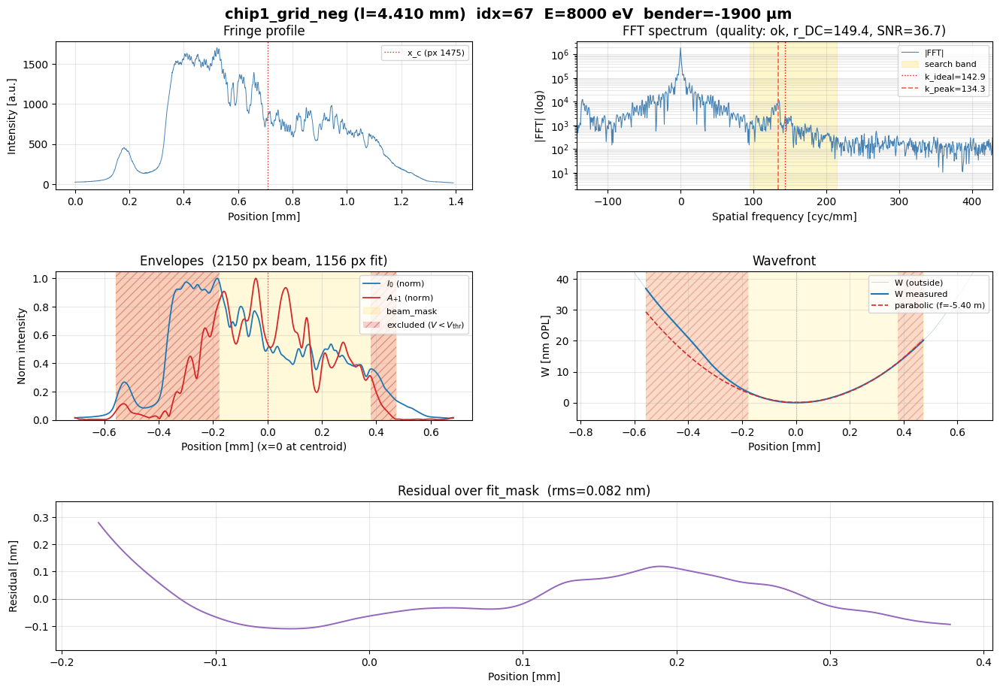

In [219]:
# Baseline reconstruction at current defaults — no propagation, just to get masks

KEY = "chip1_grid_neg"

res65 = wfl.reconstruct_single(
    images[65],
    dx=info["dx_m"],
    grating_pitch=info["grating_pitch_m"],
    wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][65]),
    z_gd=Z_GD_M,
    y_roi=slice(750, 775),
    V_threshold=0.4,
    I0_threshold=0.02,
    propagate=False,
    verbose=True,
)
_ = wfl.plot_result(res65, title=frame_label(KEY, 65, meta, info))

res67 = wfl.reconstruct_single(
    images[67],
    dx=info["dx_m"],
    grating_pitch=info["grating_pitch_m"],
    wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][67]),
    z_gd=Z_GD_M,
    y_roi=slice(750, 775),
    V_threshold=0.4,
    I0_threshold=0.02,
    propagate=False,
    verbose=True,
)

_ = wfl.plot_result(res67, title=frame_label(KEY, 67, meta, info))

Diagnostic

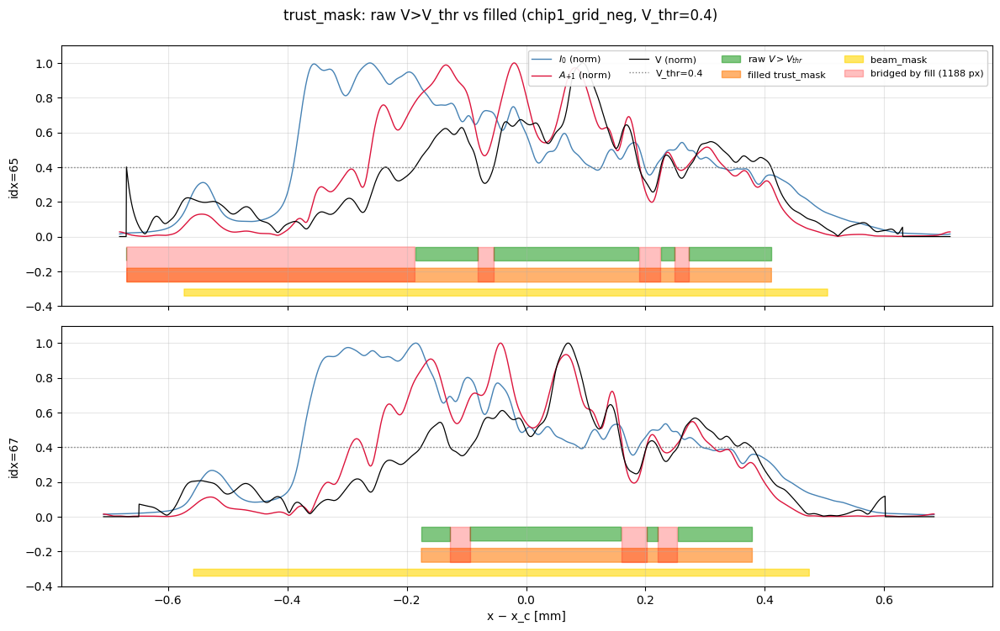

In [220]:
# Helper to split trust_mask into raw (V>V_thr) vs filled, and identify bridged pixels
def split_trust(res):
    raw     = res["V"] > res["V_threshold"]
    filled  = wfl.fill_mask_gaps(raw)
    bridged = filled & ~raw
    return raw, filled, bridged

# Plot trust_mask components for both frames, to understand 
# how filling bridges gaps in the raw mask
fig, axes = plt.subplots(2, 1, figsize=(12, 7.5), sharex=True)
for ax, res, idx in zip(axes, [res65, res67], [65, 67]):
    raw, filled, bridged = split_trust(res)
    xc_mm = res["x_mm"][res["x_c"]]
    x = res["x_mm"] - xc_mm                          # center on x_c
    Vthr = res["V_threshold"]

    ax.plot(x, res["I0"] / res["I0"].max(), color="steelblue", lw=1.0, label="$I_0$ (norm)")
    ax.plot(x, res["A1"] / res["A1"].max(), color="crimson",   lw=1.0, label="$A_{+1}$ (norm)")
    ax.plot(x, res["V"],                    color="black",     lw=0.9, label="V (norm)")
    ax.axhline(Vthr, color="gray", ls=":", lw=1, label=f"V_thr={Vthr}")

    ax.fill_between(x, -0.06, -0.14, where=raw,     color="C2",  alpha=0.6, label="raw $V>V_{thr}$")
    ax.fill_between(x, -0.18, -0.26, where=filled,  color="C1",  alpha=0.6, label="filled trust_mask")
    ax.fill_between(x, -0.30, -0.34, where=res["beam_mask"], color="gold", alpha=0.6, label="beam_mask")
    ax.fill_between(x, -0.06, -0.26, where=bridged, color="red", alpha=0.25,
                    label=f"bridged by fill ({bridged.sum()} px)")

    ax.set_ylim(-0.40, 1.10)
    ax.set_ylabel(f"idx={idx}")
    ax.grid(alpha=0.3)
    if idx == 65:
        ax.legend(loc="upper right", ncol=4, fontsize=8, framealpha=0.9)
axes[-1].set_xlabel("x − x_c [mm]")
fig.suptitle("trust_mask: raw V>V_thr vs filled (chip1_grid_neg, V_thr=0.4)", y=0.995)
plt.tight_layout()

In [221]:
for label, res in [("idx=65", res65), ("idx=67", res67)]:
    raw, filled, bridged = split_trust(res)
    xc_mm = res["x_mm"][res["x_c"]]

    if raw.any():
        i_l = np.argmax(raw)
        i_r = len(raw) - 1 - np.argmax(raw[::-1])
        l_mm = res["x_mm"][i_l] - xc_mm
        r_mm = res["x_mm"][i_r] - xc_mm
    else:
        l_mm = r_mm = float("nan")

    # Count disconnected raw clusters (proxy for "anchor spikes")
    flips = np.diff(raw.astype(int))
    n_clusters = int((flips == 1).sum() + raw[0])

    print(f"{label}:  raw {raw.sum():4d} px   filled {filled.sum():4d} px   "
          f"bridged {bridged.sum():4d} px   raw-clusters {n_clusters}")
    print(f"         raw extent: x − x_c ∈ [{l_mm:+.3f}, {r_mm:+.3f}] mm")

idx=65:  raw 1063 px   filled 2251 px   bridged 1188 px   raw-clusters 5
         raw extent: x − x_c ∈ [-0.670, +0.410] mm
idx=67:  raw  929 px   filled 1156 px   bridged  227 px   raw-clusters 4
         raw extent: x − x_c ∈ [-0.176, +0.378] mm


Fix

In [222]:
V_THR  = 0.5
I0_THR = 0.02

def reco(idx, **kw):
    return wfl.reconstruct_single(
        images[idx],
        dx=info["dx_m"],
        grating_pitch=info["grating_pitch_m"],
        wavelength=wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx]),
        z_gd=Z_GD_M, y_roi=slice(750, 775),
        V_threshold=V_THR, I0_threshold=I0_THR,
        propagate=False,
        **kw,
    )

def manual_trust_fix(res):
    """trust = fill_gaps((V > V_thr) ∩ beam_mask); then re-fit parabola."""
    V, beam = res["V"], res["beam_mask"]
    trust_fixed = wfl.fill_mask_gaps((V > res["V_threshold"]) & beam)
    fit_fixed   = beam & trust_fixed
    refit = wfl.parabolic_focal_fit(
        res["W_rad"], res["x_m"], res["wavelength"], mask=fit_fixed,
    )
    return dict(
        trust_fixed=trust_fixed,
        fit_fixed=fit_fixed,
        n_fit_fixed=int(fit_fixed.sum()),
        f_pred_fixed=refit["f_pred"],
        rms_resid_fixed=refit["rms_resid_nm"],
    )

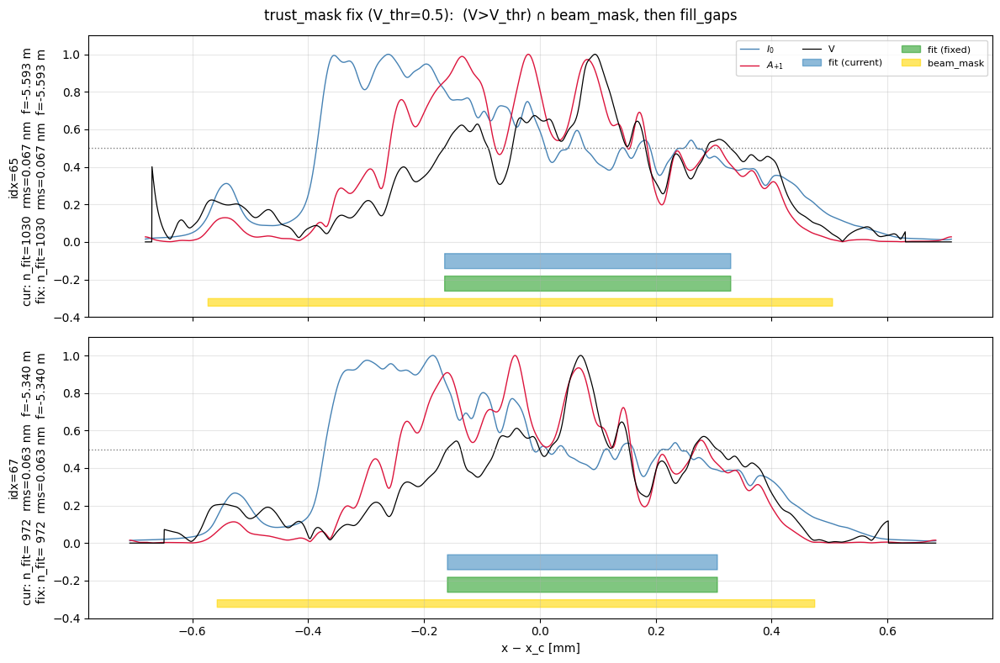

In [223]:
res65 = reco(65);  fix65 = manual_trust_fix(res65)
res67 = reco(67);  fix67 = manual_trust_fix(res67)

fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
for ax, res, fix, idx in zip(axes, [res65, res67], [fix65, fix67], [65, 67]):
    xc_mm = res["x_mm"][res["x_c"]]
    x = res["x_mm"] - xc_mm
    ax.plot(x, res["I0"]/res["I0"].max(), color="steelblue", lw=1, label="$I_0$")
    ax.plot(x, res["A1"]/res["A1"].max(), color="crimson",   lw=1, label="$A_{+1}$")
    ax.plot(x, res["V"],                  color="black",     lw=0.9, label="V")
    ax.axhline(V_THR, color="gray", ls=":", lw=1)

    ax.fill_between(x, -0.06, -0.14, where=res["fit_mask"],  color="C0", alpha=0.5, label="fit (current)")
    ax.fill_between(x, -0.18, -0.26, where=fix["fit_fixed"], color="C2", alpha=0.6, label="fit (fixed)")
    ax.fill_between(x, -0.30, -0.34, where=res["beam_mask"], color="gold", alpha=0.6, label="beam_mask")

    ax.set_ylim(-0.40, 1.10); ax.grid(alpha=0.3)
    ax.set_ylabel(
        f"idx={idx}\n"
        f"cur: n_fit={res['n_fit_px']:4d}  rms={res['rms_resid_nm']:.3f} nm  f={res['f_pred']:+.3f} m\n"
        f"fix: n_fit={fix['n_fit_fixed']:4d}  rms={fix['rms_resid_fixed']:.3f} nm  f={fix['f_pred_fixed']:+.3f} m"
    )
    if idx == 65:
        ax.legend(loc="upper right", ncol=3, fontsize=8)
axes[-1].set_xlabel("x − x_c [mm]")
fig.suptitle(f"trust_mask fix (V_thr={V_THR}):  (V>V_thr) ∩ beam_mask, then fill_gaps")
plt.tight_layout()

In [224]:
# 7 frames across 7 bender positions at the same energy
sweep_idx = np.arange(65, 79, 2)

print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_cur':>5}  {'n_fix':>5}  "
      f"{'rms_cur':>8}  {'rms_fix':>8}  "
      f"{'f_cur':>8}  {'f_fix':>8}")
print("-" * 78)
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}")

 idx       E       B  n_cur  n_fix   rms_cur   rms_fix     f_cur     f_fix
------------------------------------------------------------------------------
  65    8000   -2000   1030   1030     0.067     0.067    -5.593    -5.593
  67    8000   -1900    972    972     0.063     0.063    -5.340    -5.340
  69    8000   -1800    766    766     0.032     0.032    -5.297    -5.297
  71    8000   -1700    879    879     0.059     0.059    -4.830    -4.830
  73    8000   -1600    807    807     0.056     0.056    -4.560    -4.560
  75    8000   -1500    635    635     0.028     0.028    -4.362    -4.362
  77    8000   -1400   1219   1219     0.445     0.445    -2.725    -2.725


In [225]:
# 7 frames across 7 energies at the same bender position
sweep_idx = np.arange(65, 79, 2)

print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_cur':>5}  {'n_fix':>5}  "
      f"{'rms_cur':>8}  {'rms_fix':>8}  "
      f"{'f_cur':>8}  {'f_fix':>8}")
print("-" * 78)
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}")

 idx       E       B  n_cur  n_fix   rms_cur   rms_fix     f_cur     f_fix
------------------------------------------------------------------------------
  52    7800   -2000    928    928     0.026     0.026    -5.646    -5.646
  65    8000   -2000   1030   1030     0.067     0.067    -5.593    -5.593
  78    8200   -2000   1057   1057     0.061     0.061    -5.619    -5.619
  91    8400   -2000   1023   1023     0.064     0.064    -5.514    -5.514
 104    8600   -2000   1950   1950     0.554     0.554    -4.515    -4.515
 117    8800   -2000   1667   1667     0.442     0.442    -4.288    -4.288
 130    9000   -2000    941    941     0.039     0.039    -5.421    -5.421


**Issue.** `fill_mask_gaps` fills *all* False values between the first and last True, not just small interior gaps. Applied to raw `V > V_thr`, an isolated peripheral spike (where I₀ is low but A₊₁/I₀ clears the threshold) anchors the fill and bridges hundreds of low-V pixels into `trust_mask`, contaminating the fit.

**Fix.** Intersect with `beam_mask` *before* `fill_mask_gaps`:
`trust_mask = fill_mask_gaps((V > V_thr) ∩ beam_mask)`.

Verified across 14 frames in `chip1_grid_neg`: most unchanged (no out-of-beam anchor present); idx=52 improved rms_resid 0.541 → 0.026 nm with `f_pred` consensus-corrected.

### Library regression

In [226]:
sweep_idx = [0, 12, 52, 65, 67, 72, 77, 91, 104, 117, 130, 142]
print(f"{'idx':>4}  {'E':>6}  {'B':>6}  "
      f"{'n_lib':>5}  {'n_man':>5}  {'rms_lib':>8}  {'rms_man':>8}  "
      f"{'f_lib':>8}  {'f_man':>8}  {'match':>5}")
print("-" * 88)
all_ok = True
for i in sweep_idx:
    r  = reco(i)
    fx = manual_trust_fix(r)
    ok = (r["n_fit_px"] == fx["n_fit_fixed"]
          and np.isclose(r["rms_resid_nm"], fx["rms_resid_fixed"], atol=1e-6)
          and np.isclose(r["f_pred"],       fx["f_pred_fixed"],   atol=1e-6))
    all_ok &= ok
    print(f"{i:4d}  {meta['mono_energy_eV'][i]:6.0f}  {meta['bender_um'][i]:+6.0f}  "
          f"{r['n_fit_px']:5d}  {fx['n_fit_fixed']:5d}  "
          f"{r['rms_resid_nm']:8.3f}  {fx['rms_resid_fixed']:8.3f}  "
          f"{r['f_pred']:+8.3f}  {fx['f_pred_fixed']:+8.3f}  "
          f"{'OK' if ok else 'DIFF':>5}")
print()
print("All match." if all_ok else "Mismatch — investigate.")

 idx       E       B  n_lib  n_man   rms_lib   rms_man     f_lib     f_man  match
----------------------------------------------------------------------------------------
   0    7000   -2000     29     29     0.000     0.000    -4.775    -4.775     OK
  12    7000   -1400    579    579     0.020     0.020    -3.727    -3.727     OK
  52    7800   -2000    928    928     0.026     0.026    -5.646    -5.646     OK
  65    8000   -2000   1030   1030     0.067     0.067    -5.593    -5.593     OK
  67    8000   -1900    972    972     0.063     0.063    -5.340    -5.340     OK
  72    8000   -1650    836    836     0.058     0.058    -4.691    -4.691     OK
  77    8000   -1400   1219   1219     0.445     0.445    -2.725    -2.725     OK
  91    8400   -2000   1023   1023     0.064     0.064    -5.514    -5.514     OK
 104    8600   -2000   1950   1950     0.554     0.554    -4.515    -4.515     OK
 117    8800   -2000   1667   1667     0.442     0.442    -4.288    -4.288     OK
 130    9

/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py:1048: RuntimeWarning: parabolic_focal_fit: mask has only 29 pixels (< n_min_fit=50). Fit may be unreliable.
  fit = parabolic_focal_fit(wfr['W_rad'], wfr['x_m'], wavelength,
/var/folders/9c/0twykfpn6fz80rr9vm2z_qbc0000gn/T/ipykernel_6622/868422466.py:21: RuntimeWarning: parabolic_focal_fit: mask has only 29 pixels (< n_min_fit=50). Fit may be unreliable.
  refit = wfl.parabolic_focal_fit(


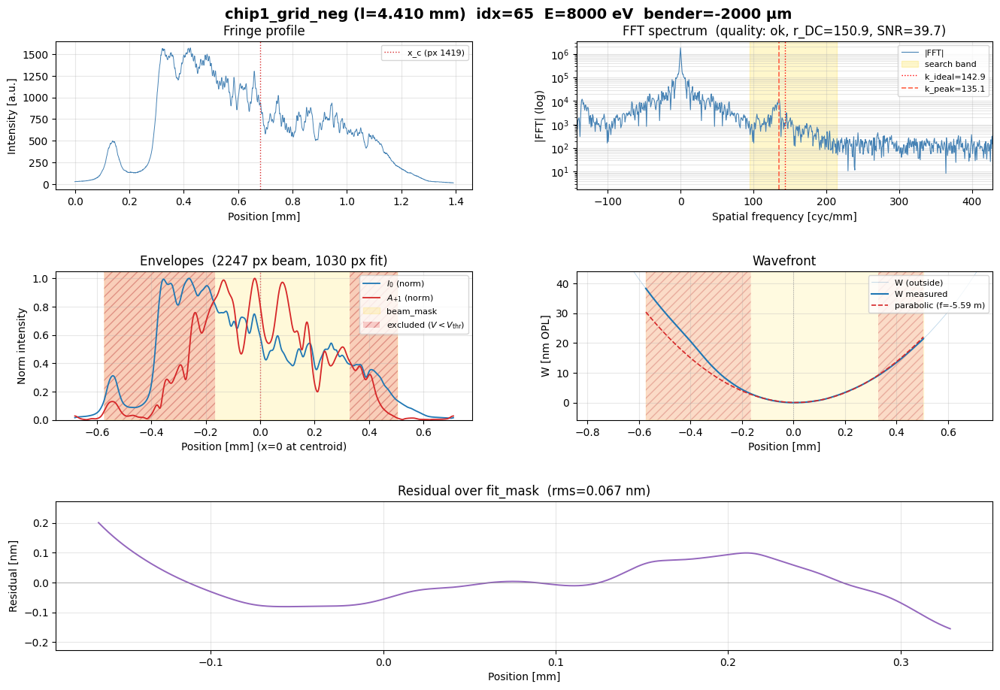

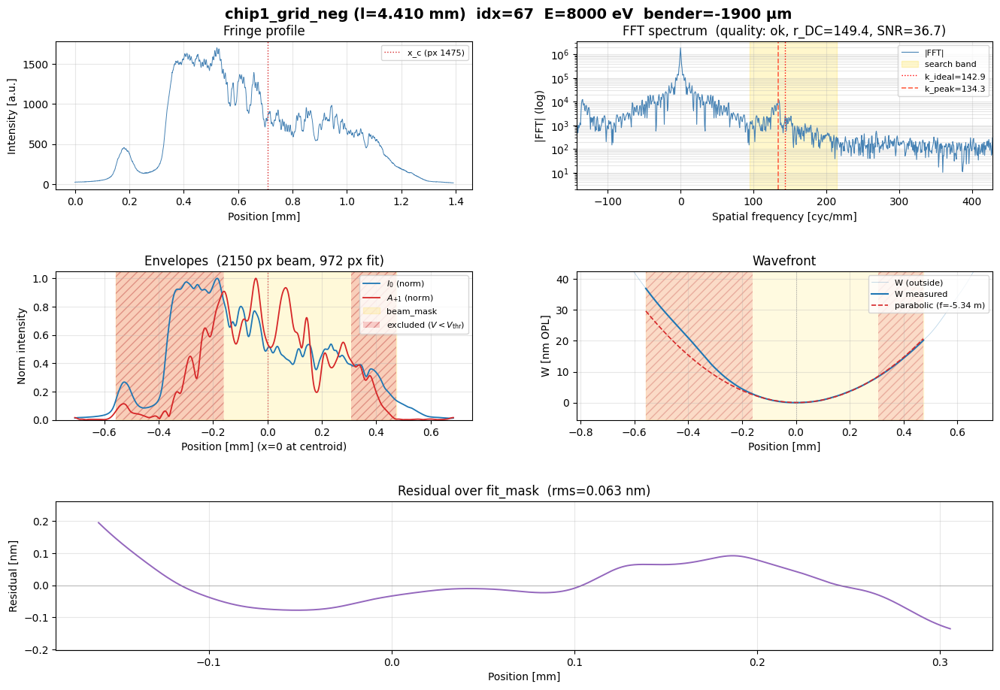

In [227]:
_ = wfl.plot_result(reco(65), title=frame_label(KEY, 65, meta, info))
_ = wfl.plot_result(reco(67), title=frame_label(KEY, 67, meta, info))

### Reconstruction + propagation

[  ok]  λ=0.15nm  k_peak=134.3 cyc/mm  r_DC=166.2  SNR=54.6  f_pred=-5.09m  RMS_W=9.4nm  RMS_resid=0.174nm  z_focus=-5.66m(fwhm_min)  RMS@focus=0.159nm

quality           = ok
f_pred            = -5094.370 mm
z_focus           = -5655.954 mm (fwhm_min)
rms_W_nm          = 9.360 nm
rms_resid_nm      = 0.174 nm
rms_at_focus_nm   = 0.159 nm
n_fit_px          = 1269
dc_carrier_ratio  = 166.2
carrier_snr       = 54.6


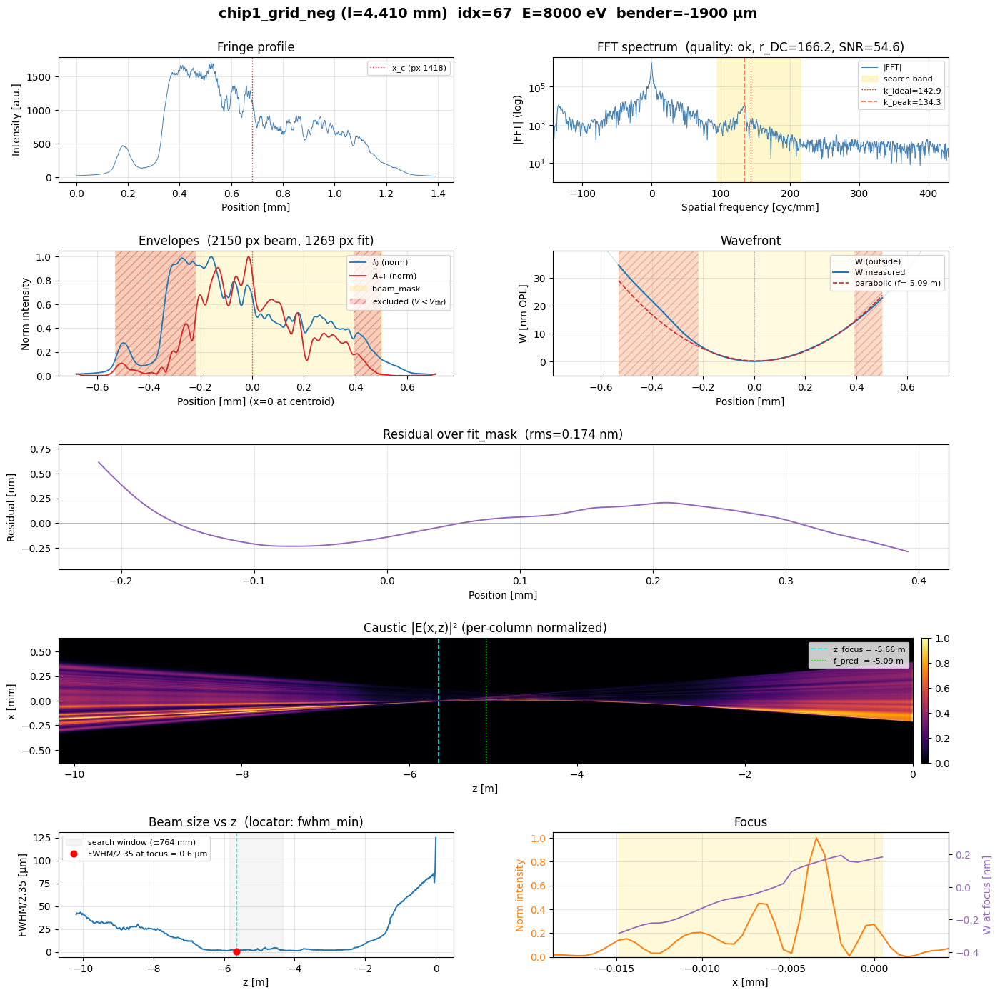

In [239]:
Z_GD_M = 0.3

idx = 67
wavelength = wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx])

res = wfl.reconstruct_single(
    images[idx],
    dx            = info["dx_m"],
    grating_pitch = info["grating_pitch_m"],
    wavelength    = wavelength,
    z_gd          = Z_GD_M,
    y_roi         = y_roi_chip1,
    V_threshold   = 0.5,
    I0_threshold  = 0.02,
    propagate     = True,
    caustic_amplitude = 'gated',
    verbose       = True,
)

print(f"\nquality           = {res['quality']}")
print(f"f_pred            = {res['f_pred']*1e3:.3f} mm")
if 'z_focus' in res:
    print(f"z_focus           = {res['z_focus']*1e3:.3f} mm "
          f"({res.get('z_focus_locator', '?')})")
print(f"rms_W_nm          = {res['rms_W_nm']:.3f} nm")
print(f"rms_resid_nm      = {res['rms_resid_nm']:.3f} nm")
if 'rms_at_focus_nm' in res:
    print(f"rms_at_focus_nm   = {res['rms_at_focus_nm']:.3f} nm")
print(f"n_fit_px          = {res['n_fit_px']}")
print(f"dc_carrier_ratio  = {res['dc_carrier_ratio']:.1f}")
print(f"carrier_snr       = {res['carrier_snr']:.1f}")

_ = wfl.plot_result(res, title=frame_label("chip1_grid_neg", idx, meta, info))
if 'debug' in res:
    _ = wfl.plot_caustic_amplitude(res['debug'],
        title=f"Caustic — {frame_label('chip1_grid_neg', idx, meta, info)}")

## Chip 2 Sanity

### Load data and preview

In [241]:
images, meta, info = get_scan("chip2_grid_neg")

chip2_grid_neg (l=7.900 mm)  idx=65  E=8000 eV  bender=-2000 µm


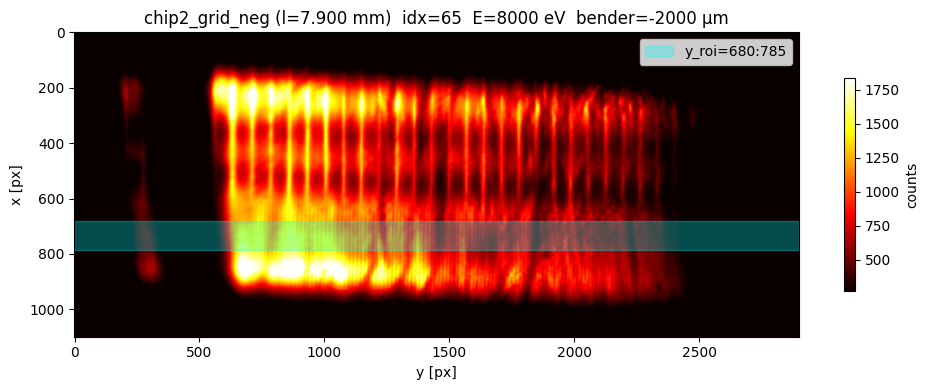

In [209]:
idx = 65
print(frame_label("chip2_grid_neg", idx, meta, info))

plt.figure(figsize=(10, 4))
plt.imshow(images[idx].T, cmap="hot", aspect="auto",
           vmin=np.percentile(images[idx],50), vmax=np.percentile(images[idx], 99.5))
plt.axhspan(680, 785, color="cyan", alpha=0.3, label="y_roi=680:785")
plt.title(frame_label("chip2_grid_neg", idx, meta, info))
plt.xlabel("y [px]"); plt.ylabel("x [px]")
plt.colorbar(label="counts", shrink=0.7)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### `y_roi` width search (carrier_snr ruler)

Sweep ROI width with center fixed at 737.5; rank by carrier amplitude, SNR, and DC/carrier ratio. Wider helps SNR via √N_y averaging but loses visibility via tilt-sinc — there's a finite optimum.


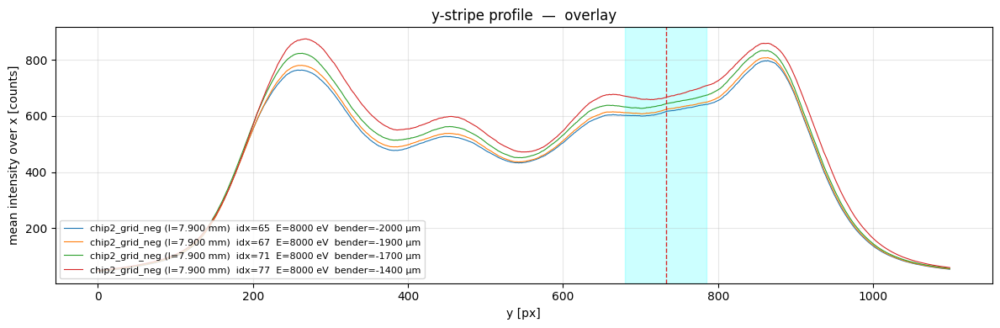

In [210]:
# y-stripe overlay across 4 benders

# Brightest-stripe location along y (= axis 1 of images[idx])
idx_list = [65, 67, 71, 77]

plt.figure(figsize=(12, 4))

for idx in idx_list:
    profile_y = images[idx].mean(axis=0)
    N_y_total = images[idx].shape[1]
    plt.plot(np.arange(N_y_total), profile_y, lw=0.8,
             label=frame_label('chip2_grid_neg', idx, meta, info))

plt.axvline(732.5, color='C3', ls='--', lw=1)#, label='y_center=737.5')
plt.axvspan(680, 785, color='cyan', alpha=0.2)#, label='N_y=25 (725:750)')
plt.xlabel('y [px]'); plt.ylabel('mean intensity over x [counts]')
plt.title("y-stripe profile  —  overlay")
plt.legend(loc='lower left', fontsize=8)
plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

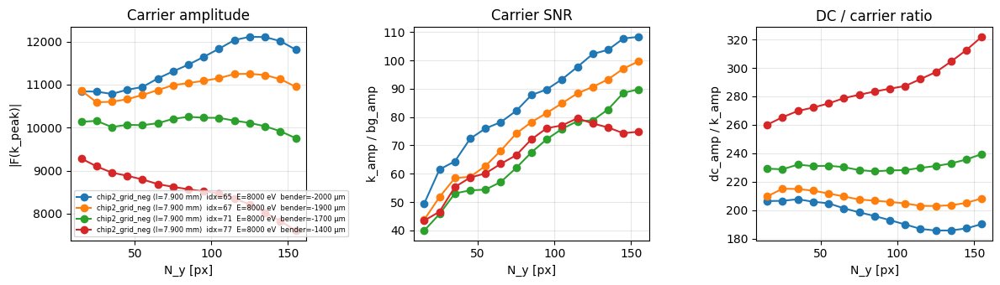

N_y sweep — chip2_grid_neg (l=7.900 mm)  idx=65  E=8000 eV  bender=-2000 µm
 N_y         y_roi       k_amp      snr     dc/k  k_pk[c/mm]
----------------------------------------------------------------
  15    (730, 745)    1.08e+04     49.5   206.48      153.02
  25    (725, 750)    1.08e+04     61.5   206.69      153.02
  35    (720, 755)    1.08e+04     64.3   207.79      153.02
  45    (715, 760)    1.09e+04     72.4   206.03      152.30
  55    (710, 765)    1.09e+04     76.0   204.94      152.30
  65    (705, 770)    1.11e+04     78.2   201.41      152.30
  75    (700, 775)    1.13e+04     82.2   198.61      152.30
  85    (695, 780)    1.15e+04     87.8   196.03      152.30
  95    (690, 785)    1.16e+04     89.8   193.10      152.30
 105    (685, 790)    1.18e+04     93.4   190.10      152.30
 115    (680, 795)    1.20e+04     97.7   186.98      152.30
 125    (675, 800)    1.21e+04    102.3   185.80      152.30
 135    (670, 805)    1.21e+04    103.8   185.89      152.30
 145 

In [172]:
# N_y sweep plots for 4 benders

# Half-open slice [a, a+N_y) centered at 737.5 ⇒ a = (1475 - N_y) // 2  (odd N_y)
N_y_list = list(range(15, 156, 10))
idx_list = [65, 67, 71, 77]

records_by_idx = {}
for idx in idx_list:
    records = []
    for N_y in N_y_list:
        a = (1475 - N_y) // 2
        y_roi = slice(a, a + N_y)
        profile = wfl.extract_profile(images[idx], y_roi, axis=1)
        car = wfl.find_carrier(profile, dx=info["dx_m"],
                               grating_pitch=info["grating_pitch_m"])
        records.append(dict(
            N_y         = N_y,
            y_roi       = (y_roi.start, y_roi.stop),
            k_peak      = car["k_peak"],
            k_amp       = car["k_amp"],
            dc_amp      = car["dc_amp"],
            bg_amp      = car["bg_amp"],
            carrier_snr = car["k_amp"] / car["bg_amp"],
            dc_ratio    = car["dc_amp"] / car["k_amp"],
        ))
    records_by_idx[idx] = records

fig, axes = plt.subplots(1, 3, figsize=(12, 3.5))

for idx in idx_list:
    records = records_by_idx[idx]
    N_arr = np.array([r['N_y'] for r in records])
    label = frame_label('chip2_grid_neg', idx, meta, info)

    axes[0].plot(N_arr, [r['k_amp']       for r in records], 'o-', label=label)
    axes[1].plot(N_arr, [r['carrier_snr'] for r in records], 'o-', label=label)
    axes[2].plot(N_arr, [r['dc_ratio']    for r in records], 'o-', label=label)

axes[0].set_xlabel('N_y [px]'); axes[0].set_ylabel('|F(k_peak)|')
axes[0].set_title('Carrier amplitude'); axes[0].grid(alpha=0.3)

axes[1].set_xlabel('N_y [px]'); axes[1].set_ylabel('k_amp / bg_amp')
axes[1].set_title('Carrier SNR'); axes[1].grid(alpha=0.3)

axes[2].set_xlabel('N_y [px]'); axes[2].set_ylabel('dc_amp / k_amp')
axes[2].set_title('DC / carrier ratio'); axes[2].grid(alpha=0.3)

axes[0].legend(fontsize=6)
# fig.suptitle("N_y sweep — overlay", y=1.02)
plt.tight_layout(); plt.show()

for idx in idx_list:
    records = records_by_idx[idx]

    print(f"N_y sweep — {frame_label('chip2_grid_neg', idx, meta, info)}")
    print(f"{'N_y':>4}  {'y_roi':>12}  {'k_amp':>10}  {'snr':>7}  {'dc/k':>7}  {'k_pk[c/mm]':>10}")
    print("-" * 64)
    for r in records:
        print(f"{r['N_y']:4d}  {str(r['y_roi']):>12}  "
              f"{r['k_amp']:10.2e}  {r['carrier_snr']:7.1f}  "
              f"{r['dc_ratio']:7.2f}  {r['k_peak']*1e-3:10.2f}")
    print()  # blank line between tables

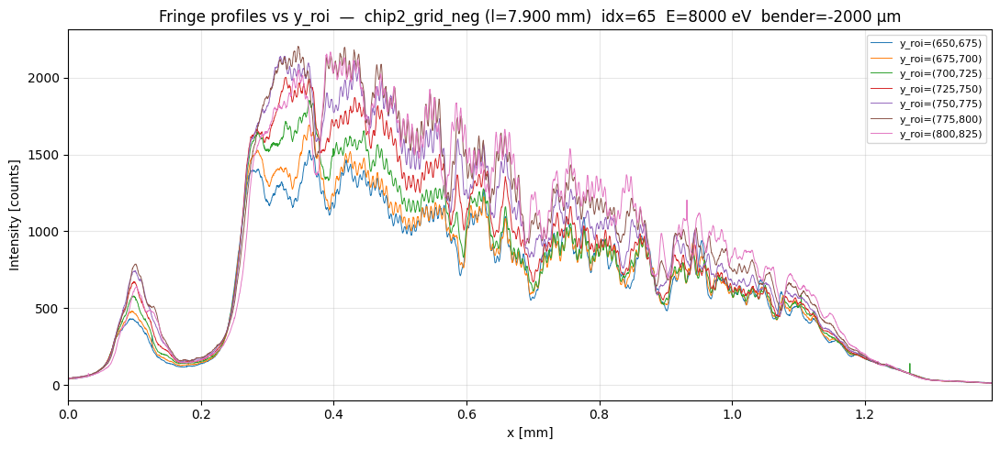

In [ ]:
# fringe profiles at fixed-stripe ROI candidates

idx = 65
y_candidates = [(650, 675), (675, 700), (700, 725), (725, 750), (750, 775), (775, 800), (800, 825)]#, (825, 850)]
x_mm = np.arange(images[idx].shape[0]) * info["dx_m"] * 1e3

plt.figure(figsize=(11, 5))
for (y0, y1) in y_candidates:
    prof = images[idx][:, y0:y1].mean(axis=1)
    plt.plot(x_mm, prof, lw=0.7, label=f"y_roi=({y0},{y1})")
plt.xlabel("x [mm]")
plt.ylabel("Intensity [counts]")
plt.xlim(x_mm[0], x_mm[-1])
plt.title(f"Fringe profiles vs y_roi  —  {frame_label('chip2_grid_neg', idx, meta, info)}")
plt.legend(fontsize=8, loc="upper right")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### Tilt characterization

Optimize x_crop choice on idx=65: scan ROI width, then center at fixed width=105, then cross-frame stability. Lock the local-tilt-minimum window.


In [ ]:
# 2D FFTs of those fringe profiles, to see how the carrier and sidebands evolve with y_roi
from numpy.fft import fft2, fftshift, fftfreq


k_ideal = 161.29 cyc/mm  (chip 2, p=6.2 µm)

x_crop = (720, 745)  width= 25 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +3.659     cx_neg = -3.659   cyc/mm
  tilt    = +1.388 deg

x_crop = (715, 750)  width= 35 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +5.733     cx_neg = -5.733   cyc/mm
  tilt    = +2.174 deg

x_crop = (710, 755)  width= 45 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.906     cx_neg = -1.906   cyc/mm
  tilt    = +0.723 deg

x_crop = (705, 760)  width= 55 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.820     cx_neg = -1.820   cyc/mm
  tilt    = +0.690 deg

x_crop = (700, 765)  width= 65 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.325     cx_neg = -1.325   cyc/mm
  tilt    = +0.503 deg

x_crop = (695, 770)  width= 75 px
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +0.536     cx_neg = -0.536   cyc/mm
  tilt    = +0.203 deg

x_crop = (690, 775)  width= 85 

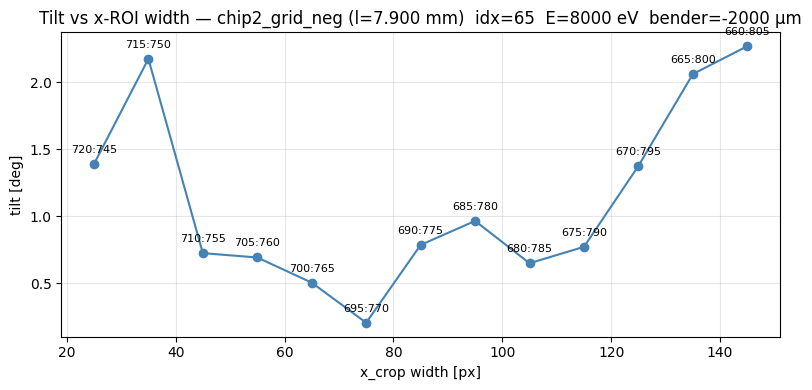

In [169]:
# tilt vs x_crop width sweep

idx_tilt = 65
y_crop = slice(500, 1700)   # fringe direction (axis 0)

# x_crop_list = [(725, 750), (720, 755), (715, 760), (710, 765), (705, 770), (700, 775),
#                (695, 780), (690, 785), (685, 790), (680, 795), (675, 800), (670, 805), (665, 810)]
x_crop_list = [(720, 745), (715, 750), (710, 755), (705, 760), (700, 765), (695, 770), 
               (690, 775), (685, 780), (680, 785), (675, 790), (670, 795), (665, 800), (660, 805)]

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)\n")

tilt_records = []
for x0, x1 in x_crop_list:
    x_crop = slice(x0, x1)

    crop = images[idx_tilt][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop))
    aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    # Locate ±carrier peaks at kx=0
    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    # kx centroid in ±100 cyc/mm at each carrier row
    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records.append(dict(
        x_crop   = (x0, x1),
        width    = x1 - x0,
        ky_pos   = ky_pos,
        ky_neg   = ky_neg,
        cx_pos   = cx_pos,
        cx_neg   = cx_neg,
        tilt_deg = np.degrees(tilt_rad),
    ))

    print(f"x_crop = ({x0}, {x1})  width={x1-x0:3d} px")
    print(f"  ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
    print(f"  cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
    print(f"  tilt    = {np.degrees(tilt_rad):+.3f} deg\n")

# --- Plot tilt vs ROI choice ---
widths    = [r['width']    for r in tilt_records]
tilts     = [r['tilt_deg'] for r in tilt_records]
labels    = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records]

plt.figure(figsize=(8, 4))
plt.plot(widths, tilts, 'o-', color='steelblue')
for w, t, lab in zip(widths, tilts, labels):
    plt.annotate(lab, (w, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.xlabel('x_crop width [px]')
plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI width — {frame_label('chip2_grid_neg', idx_tilt, meta, info)}")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

k_ideal = 161.29 cyc/mm  (chip 2, p=6.2 µm)
       x_crop   center    ky_pos    ky_neg    cx_pos    cx_neg     tilt
------------------------------------------------------------------------------
  ( 655, 760)    707.5   +151.04   -151.04    +0.643    -0.643   +0.244
  ( 660, 765)    712.5   +151.04   -151.04    -0.341    +0.341   -0.129
  ( 665, 770)    717.5   +151.04   -151.04    +1.325    -1.325   +0.503
  ( 670, 775)    722.5   +151.04   -151.04    +2.210    -2.210   +0.838
  ( 675, 780)    727.5   +151.04   -151.04    +2.446    -2.446   +0.928
  ( 680, 785)    732.5   +151.04   -151.04    +1.707    -1.707   +0.648
  ( 685, 790)    737.5   +151.04   -151.04    +2.460    -2.460   +0.933
  ( 690, 795)    742.5   +151.04   -151.04    +4.633    -4.633   +1.757
  ( 695, 800)    747.5   +151.04   -151.04    +4.556    -4.556   +1.728
  ( 700, 805)    752.5   +151.04   -151.04    +5.319    -5.319   +2.017
  ( 705, 810)    757.5   +151.04   -151.04    +6.237    -6.237   +2.365


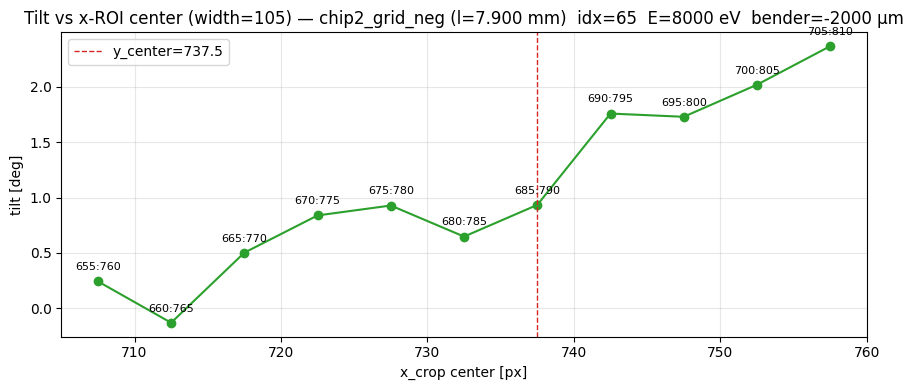

In [176]:
# Tilt vs x_crop center at fixed width=105. Union of cells 9+10's shifts.
centers       = np.arange(707.5, 757.51, 5)                    # 11 centers
x_crop_list2  = [(int(c - 52.5), int(c + 52.5)) for c in centers]

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"{'x_crop':>13}  {'center':>7}  {'ky_pos':>8}  {'ky_neg':>8}  "
      f"{'cx_pos':>8}  {'cx_neg':>8}  {'tilt':>7}")
print("-" * 78)

tilt_records_shift = []
for (x0, x1), c in zip(x_crop_list2, centers):
    x_crop = slice(x0, x1)

    crop = images[idx_tilt][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop)); aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    rec = dict(x_crop=(x0, x1), x_center=c,
               ky_pos=ky_pos, ky_neg=ky_neg,
               cx_pos=cx_pos, cx_neg=cx_neg,
               tilt_deg=np.degrees(tilt_rad))
    tilt_records_shift.append(rec)

    print(f"  ({x0:>4},{x1:>4})  {c:7.1f}  "
          f"{ky_pos*1e-3:+8.2f}  {ky_neg*1e-3:+8.2f}  "
          f"{cx_pos*1e-3:+8.3f}  {cx_neg*1e-3:+8.3f}  "
          f"{np.degrees(tilt_rad):+7.3f}")

# Plot
xs = [r['x_center'] for r in tilt_records_shift]
ts = [r['tilt_deg'] for r in tilt_records_shift]
lbls = [f"{r['x_crop'][0]}:{r['x_crop'][1]}" for r in tilt_records_shift]

plt.figure(figsize=(9, 4))
plt.plot(xs, ts, 'o-', color='C2')
for c, t, lab in zip(xs, ts, lbls):
    plt.annotate(lab, (c, t), textcoords="offset points",
                 xytext=(0, 8), ha='center', fontsize=8)
plt.axvline(737.5, color='C3', ls='--', lw=1, label='y_center=737.5')
plt.xlabel('x_crop center [px]'); plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs x-ROI center (width=105) — "
          f"{frame_label('chip2_grid_neg', idx_tilt, meta, info)}")
plt.legend(); plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

k_ideal = 161.29 cyc/mm  (chip 2, p=6.2 µm)
x_crop  = (680, 785)

idx = 65
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.707     cx_neg = -1.707   cyc/mm
  tilt    = +0.648 deg

idx = 66
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = -0.324     cx_neg = +0.324   cyc/mm
  tilt    = -0.123 deg

idx = 67
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.416     cx_neg = -1.416   cyc/mm
  tilt    = +0.537 deg

idx = 68
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +1.475     cx_neg = -1.475   cyc/mm
  tilt    = +0.559 deg

idx = 69
  ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
  cx_pos  = +0.364     cx_neg = -0.364   cyc/mm
  tilt    = +0.138 deg

idx = 70
  ky_pos  = +149.31    ky_neg = -149.31  cyc/mm
  cx_pos  = +0.318     cx_neg = -0.318   cyc/mm
  tilt    = +0.122 deg

idx = 71
  ky_pos  = +149.31    ky_neg = -149.31  cyc/mm
  cx_pos  = +0.337     cx_neg = -0.337   cyc/mm
  tilt    = +0.129 deg

idx = 72
  ky_pos  = +149.31   

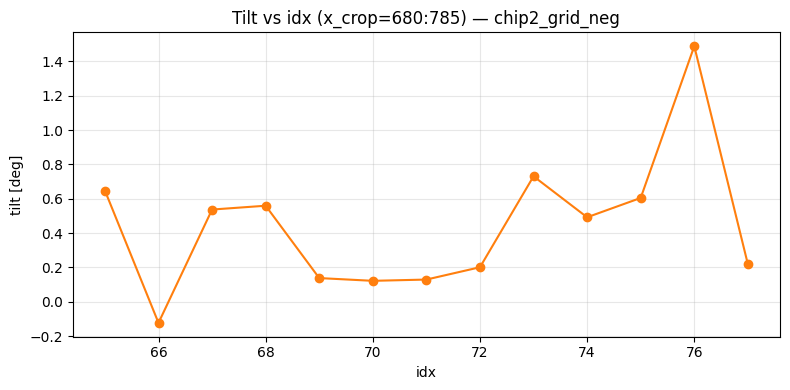

In [170]:
# tilt vs idx

y_crop = slice(500, 1700)
x_crop = slice(680, 785)
idx_list = list(range(65, 78))   # 65 to 77 inclusive

def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

k_ideal = 1.0 / info["grating_pitch_m"]
print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"x_crop  = ({x_crop.start}, {x_crop.stop})\n")

tilt_records_idx = []
for idx in idx_list:
    crop = images[idx][y_crop, x_crop].astype(float)
    crop -= crop.mean()

    F  = fftshift(fft2(crop))
    aF = np.abs(F)
    nyc, nxc = crop.shape
    ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
    kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

    ix0     = np.argmin(np.abs(kx_ax))
    ky_cut  = aF[:, ix0]
    band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
    band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
    ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
    ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

    iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
    cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
    win = np.abs(kx_ax) < 100e3
    cx_pos = centroid(kx_ax[win], cut_pos[win])
    cx_neg = centroid(kx_ax[win], cut_neg[win])

    tilt_rad = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

    tilt_records_idx.append(dict(
        idx      = idx,
        ky_pos   = ky_pos,
        ky_neg   = ky_neg,
        cx_pos   = cx_pos,
        cx_neg   = cx_neg,
        tilt_deg = np.degrees(tilt_rad),
    ))

    print(f"idx = {idx}")
    print(f"  ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
    print(f"  cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
    print(f"  tilt    = {np.degrees(tilt_rad):+.3f} deg\n")

# --- Plot tilt vs idx ---
idxs  = [r['idx']      for r in tilt_records_idx]
tilts = [r['tilt_deg'] for r in tilt_records_idx]

plt.figure(figsize=(8, 4))
plt.plot(idxs, tilts, 'o-', color='C1')
plt.xlabel('idx')
plt.ylabel('tilt [deg]')
plt.title(f"Tilt vs idx (x_crop={x_crop.start}:{x_crop.stop}) — chip2_grid_neg")
plt.grid(alpha=0.3)
plt.tight_layout(); plt.show()

k_ideal = 161.29 cyc/mm  (chip 2, p=6.2 µm)
ky_pos  = +151.04    ky_neg = -151.04  cyc/mm
cx_pos  = +1.707     cx_neg = -1.707   cyc/mm

tilt   = +0.648 deg


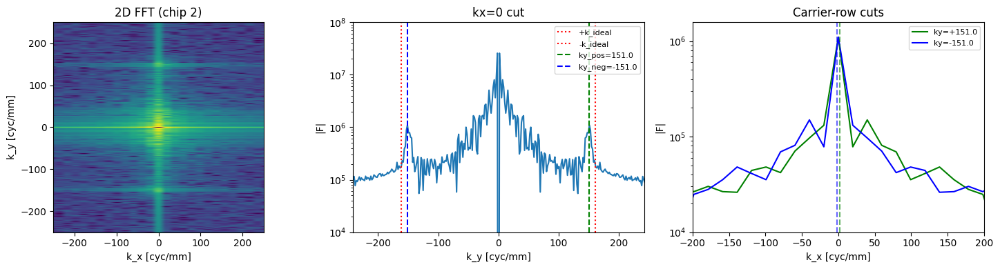

In [174]:
# single-config 2D FFT

idx_tilt = 65
y_crop = slice(500, 1700)   # fringe direction (axis 0)
x_crop = slice(680, 785)     # stripe direction (axis 1)

crop = images[idx_tilt][y_crop, x_crop].astype(float)
crop -= crop.mean()

F  = fftshift(fft2(crop))
aF = np.abs(F)
nyc, nxc = crop.shape
ky_ax = fftshift(fftfreq(nyc, d=info["dx_m"]))
kx_ax = fftshift(fftfreq(nxc, d=info["dx_m"]))

# Locate ±carrier peaks at kx=0
k_ideal = 1.0 / info["grating_pitch_m"]
ix0     = np.argmin(np.abs(kx_ax))
ky_cut  = aF[:, ix0]
band_pos = (ky_ax >  0.8 * k_ideal) & (ky_ax <  1.2 * k_ideal)
band_neg = (ky_ax < -0.8 * k_ideal) & (ky_ax > -1.2 * k_ideal)
ky_pos = ky_ax[band_pos][np.argmax(ky_cut[band_pos])]
ky_neg = ky_ax[band_neg][np.argmax(ky_cut[band_neg])]

# kx centroid in ±100 cyc/mm at each carrier row
def centroid(x, w):
    w = np.clip(w - w.min(), 0, None)
    return np.sum(x * w) / np.sum(w)

iy_pos, iy_neg = (np.argmin(np.abs(ky_ax - k)) for k in (ky_pos, ky_neg))
cut_pos, cut_neg = aF[iy_pos], aF[iy_neg]
win = np.abs(kx_ax) < 100e3
cx_pos = centroid(kx_ax[win], cut_pos[win])
cx_neg = centroid(kx_ax[win], cut_neg[win])

tilt_rad_chip2 = np.arctan((cx_pos - cx_neg) / (ky_pos - ky_neg))

print(f"k_ideal = {k_ideal*1e-3:.2f} cyc/mm  (chip 2, p=6.2 µm)")
print(f"ky_pos  = {ky_pos*1e-3:+.2f}    ky_neg = {ky_neg*1e-3:+.2f}  cyc/mm")
print(f"cx_pos  = {cx_pos*1e-3:+.3f}     cx_neg = {cx_neg*1e-3:+.3f}   cyc/mm")
print(f"\ntilt   = {np.degrees(tilt_rad_chip2):+.3f} deg")

# 2D FFT + cuts
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ext = [kx_ax.min()*1e-3, kx_ax.max()*1e-3,
       ky_ax.min()*1e-3, ky_ax.max()*1e-3]
axes[0].imshow(np.log10(aF + 1), origin="lower", aspect="equal",
               extent=ext, cmap="viridis", vmin=3, vmax=7)
axes[0].set_xlim(-250, 250); axes[0].set_ylim(-250, 250)
axes[0].set_xlabel("k_x [cyc/mm]"); axes[0].set_ylabel("k_y [cyc/mm]")
axes[0].set_title("2D FFT (chip 2)")

axes[1].semilogy(ky_ax*1e-3, ky_cut)
for k, c, lab in [( k_ideal, "r", "+k_ideal"),
                  (-k_ideal, "r", "-k_ideal"),
                  ( ky_pos, "g", f"ky_pos={ky_pos*1e-3:.1f}"),
                  ( ky_neg, "b", f"ky_neg={ky_neg*1e-3:.1f}")]:
    axes[1].axvline(k*1e-3, color=c, ls="--" if "ky" in lab else ":", label=lab)
axes[1].set_xlim(-1.5*k_ideal*1e-3, 1.5*k_ideal*1e-3)
axes[1].set_ylim(1e4, 1e8)
axes[1].set_xlabel("k_y [cyc/mm]"); axes[1].set_ylabel("|F|")
axes[1].set_title("kx=0 cut"); axes[1].legend(fontsize=8)

axes[2].semilogy(kx_ax*1e-3, cut_pos, color="g", label=f"ky={ky_pos*1e-3:+.1f}")
axes[2].semilogy(kx_ax*1e-3, cut_neg, color="b", label=f"ky={ky_neg*1e-3:+.1f}")
axes[2].axvline(cx_pos*1e-3, color="g", ls="--", alpha=0.6)
axes[2].axvline(cx_neg*1e-3, color="b", ls="--", alpha=0.6)
axes[2].set_xlim(-200, 200)
axes[2].set_ylim(bottom=1e4)
axes[2].set_xlabel("k_x [cyc/mm]"); axes[2].set_ylabel("|F|")
axes[2].set_title("Carrier-row cuts"); axes[2].legend(fontsize=8)
plt.tight_layout(); plt.show()

### Lock `y_roi_chip2`

In [171]:
y_roi_chip2 = slice(680, 785)     # N_y=105, center 732.5; tilt-minimized
print(f"chip-2 y_roi locked: slice({y_roi_chip2.start}, {y_roi_chip2.stop})  "
      f"width={y_roi_chip2.stop - y_roi_chip2.start}  center={(y_roi_chip2.start + y_roi_chip2.stop)/2}")

chip-2 y_roi locked: slice(680, 785)  width=105  center=732.5


### Reconstruction + propagation

[ bad]  λ=0.15nm  k_peak=152.3 cyc/mm  r_DC=203.7  SNR=84.3  f_pred=-5.02m  RMS_W=10.3nm  RMS_resid=0.181nm  z_focus=-5.40m(fwhm_min)  RMS@focus=0.070nm

quality           = bad
f_pred            = -5024.445 mm
z_focus           = -5404.782 mm (fwhm_min)
rms_W_nm          = 10.310 nm
rms_resid_nm      = 0.181 nm
rms_at_focus_nm   = 0.070 nm
n_fit_px          = 1257
dc_carrier_ratio  = 203.7
carrier_snr       = 84.3


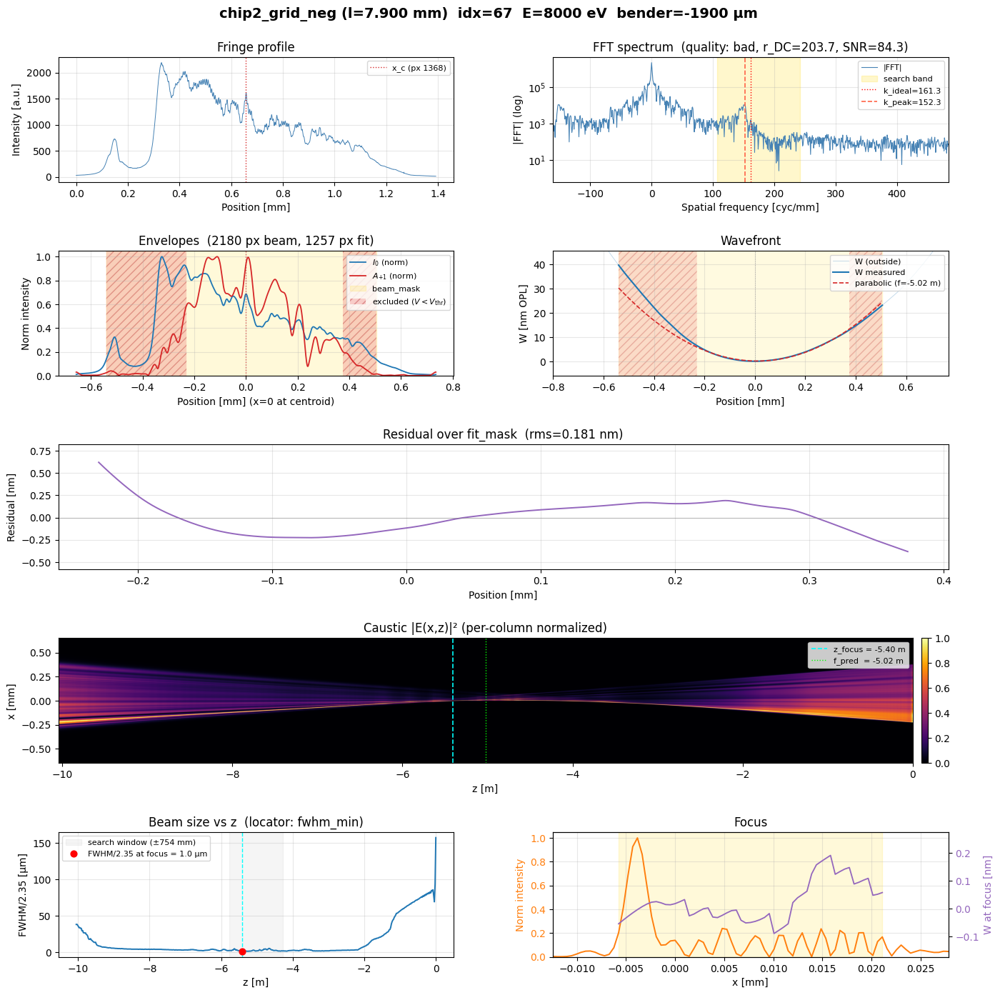

In [248]:
# images, meta, info = get_scan("chip2_grid_neg")

idx = 67
wavelength = wfl.energy_eV_to_wavelength_m(meta["mono_energy_eV"][idx])

res = wfl.reconstruct_single(
    images[idx],
    dx            = info["dx_m"],
    grating_pitch = info["grating_pitch_m"],
    wavelength    = wavelength,
    z_gd          = Z_GD_M,
    y_roi         = y_roi_chip2,
    V_threshold   = 0.4,
    I0_threshold  = 0.02,
    propagate     = True,
    caustic_amplitude = 'gated',
    verbose       = True,
)

print(f"\nquality           = {res['quality']}")
print(f"f_pred            = {res['f_pred']*1e3:.3f} mm")
if 'z_focus' in res:
    print(f"z_focus           = {res['z_focus']*1e3:.3f} mm "
          f"({res.get('z_focus_locator', '?')})")
print(f"rms_W_nm          = {res['rms_W_nm']:.3f} nm")
print(f"rms_resid_nm      = {res['rms_resid_nm']:.3f} nm")
if 'rms_at_focus_nm' in res:
    print(f"rms_at_focus_nm   = {res['rms_at_focus_nm']:.3f} nm")
print(f"n_fit_px          = {res['n_fit_px']}")
print(f"dc_carrier_ratio  = {res['dc_carrier_ratio']:.1f}")
print(f"carrier_snr       = {res['carrier_snr']:.1f}")

_ = wfl.plot_result(res, title=frame_label("chip2_grid_neg", idx, meta, info))
if 'debug' in res:
    _ = wfl.plot_caustic_amplitude(res['debug'],
        title=f"Caustic — {frame_label('chip2_grid_neg', idx, meta, info)}")

## Lock `CHIP_DEFAULTS`


In [37]:
CHIP_DEFAULTS = {
    1: dict(y_roi=slice(710, 815), V_threshold=0.5, I0_threshold=0.02),
    2: dict(y_roi=slice(680, 785), V_threshold=0.5, I0_threshold=0.02),
}

Z_GD_M = 0.3   # grating-detector distance [m], shared across all BL 5.3.1 scans

for chip, d in CHIP_DEFAULTS.items():
    print(f"chip {chip}: y_roi={d['y_roi']}, V_thr={d['V_threshold']}, "
          f"I0_thr={d['I0_threshold']}")
print(f"Z_GD_M = {Z_GD_M} m")

chip 1: y_roi=slice(710, 815, None), V_thr=0.5, I0_thr=0.02
chip 2: y_roi=slice(680, 785, None), V_thr=0.5, I0_thr=0.02
Z_GD_M = 0.3 m


# ANALYSIS

## Bulk Triage

Triage stage: reconstruct all 8 scans across V_threshold ∈ {0.4, 0.5} with no propagation. Outputs feed three decisions:
1. recalibrated r_good / r_bad for BL 5.3.1
2. global V_threshold lock (or keep both)
3. per-scan usable sub-regions for Phase 3 / 4

### Load all scans 

8 scans: chip1/2 × {grid_neg, grid_zero, lin_near, lin_far}.

In [9]:
SCANS.clear()

In [10]:
CHIP_DEFAULTS = {
    1: dict(y_roi=slice(710, 815), V_threshold=0.5, I0_threshold=0.02),
    2: dict(y_roi=slice(680, 785), V_threshold=0.5, I0_threshold=0.02),
}

Z_GD_M = 0.3   # grating-detector distance [m], shared across all BL 5.3.1 scans

for chip, d in CHIP_DEFAULTS.items():
    print(f"chip {chip}: y_roi={d['y_roi']}, V_thr={d['V_threshold']}, "
          f"I0_thr={d['I0_threshold']}")
print(f"Z_GD_M = {Z_GD_M} m")

chip 1: y_roi=slice(710, 815, None), V_thr=0.5, I0_thr=0.02
chip 2: y_roi=slice(680, 785, None), V_thr=0.5, I0_thr=0.02
Z_GD_M = 0.3 m


In [11]:
# P2.0 — load all 8 scans into the SCANS cache
# Slow on first run (~1–2 min/scan). SCANS cache handles re-entry.

ALL_KEYS = [
    "chip1_grid_neg", "chip1_grid_zero", "chip1_lin_near", "chip1_lin_far",
    "chip2_grid_neg", "chip2_grid_zero", "chip2_lin_near", "chip2_lin_far",
]

for key in ALL_KEYS:
    get_scan(key)

print(f"\nLoaded {len(SCANS)} scans: {list(SCANS)}")

[chip1_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)
[chip1_grid_zero]  images (99, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 9)
[chip1_lin_near]  dx_m fallback: 0.480 µm/px (md missing)
[chip1_lin_near]  images (191, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(191,)
[chip1_lin_far]  dx_m fallback: 0.480 µm/px (md missing)
[chip1_lin_far]  images (201, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(201,)
[chip2_grid_neg]  images (143, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 13)
[chip2_grid_zero]  images (99, 2900, 1100)  dx=0.480 µm  meta keys: ['mono_energy_eV', 'bender_um']  shape=(11, 9)
[chip2_lin_near]  dx_m fallback: 0.480 µm/px (md missing)
[chip2_lin_near]  images (200, 2900, 1100)  dx=0.480 µm  meta keys: ['bcs_linear_motor_mm']  shape=(200,)
[chip2_lin_far]  dx_m fallback: 0.480 µm/px (md 

### `reco_frame` wrapper + spot check

Wrapper pulls CHIP_DEFAULTS by chip, resolves wavelength from meta
(grid) or fixed (linear), calls wfl.reconstruct_single. Spot check
reproduces chip1 & chip2 idx=67 locked sanity rms_resid.


In [ ]:
def reco_frame(key, idx, propagate=False, **overrides):
    """Reconstruct a single frame using chip-specific defaults.

    Pulls (y_roi, V_threshold, I0_threshold) from CHIP_DEFAULTS[chip] and
    physical params (dx, grating_pitch, z_gd) from DATASETS.
    Wavelength: per-frame mono_energy_eV (grid) or fixed mono_energy (linear).
    Overrides win over defaults.
    """
    images, meta, info = get_scan(key)
    chip = info["chip"]
    d    = CHIP_DEFAULTS[chip]

    if "mono_energy_eV" in meta:
        E_eV = float(meta["mono_energy_eV"][idx])
    else:
        E_eV = float(info["fixed"]["mono_energy"])
    wavelength = wfl.energy_eV_to_wavelength_m(E_eV)

    kwargs = dict(
        dx                = info["dx_m"],
        grating_pitch     = info["grating_pitch_m"],
        wavelength        = wavelength,
        z_gd              = Z_GD_M,
        y_roi             = d["y_roi"],
        V_threshold       = d["V_threshold"],
        I0_threshold      = d["I0_threshold"],
        propagate         = propagate,
        caustic_amplitude = 'gated',
    )
    kwargs.update(overrides)
    return wfl.reconstruct_single(images[idx], **kwargs)

In [13]:
# Expected (session_summary_20260613.md): chip1 0.153 nm, chip2 0.115 nm at idx=67.
# V_thr not recorded in the summary; sweep both to find the match and gauge sensitivity.

for key in ["chip1_grid_neg", "chip2_grid_neg"]:
    for V_thr in [0.4, 0.5]:
        res = reco_frame(key, 65, V_threshold=V_thr)
        print(f"{key} idx=65  V_thr={V_thr}  "
              f"rms_resid={res['rms_resid_nm']:.3f} nm  "
              f"f_pred={res['f_pred']:+.3f} m  "
              f"n_fit={res['n_fit_px']:4d}  "
              f"r_DC={res['dc_carrier_ratio']:6.1f}  "
              f"{res['quality']}")

chip1_grid_neg idx=65  V_thr=0.4  rms_resid=0.185 nm  f_pred=-5.310 m  n_fit=1341  r_DC= 168.7  ok
chip1_grid_neg idx=65  V_thr=0.5  rms_resid=0.153 nm  f_pred=-5.217 m  n_fit=1209  r_DC= 168.7  ok
chip2_grid_neg idx=65  V_thr=0.4  rms_resid=0.114 nm  f_pred=-5.411 m  n_fit=1187  r_DC= 191.2  ok
chip2_grid_neg idx=65  V_thr=0.5  rms_resid=0.055 nm  f_pred=-5.193 m  n_fit= 857  r_DC= 191.2  ok


### Bulk reconstruction

8 scans × 2 V_thr configs, propagate=False. Slim records:
idx, scan-axis labels, per-config metadata. Optional disk cache.


In [17]:
V_CONFIGS = {'V04': 0.4, 'V05': 0.5}

FRAME_KEYS  = ('dc_carrier_ratio', 'carrier_snr', 'quality')   # V_thr-independent
CONFIG_KEYS = ('f_pred', 'rms_resid_nm', 'n_fit_px')           # V_thr-dependent

def _axis_labels(meta, info, idx):
    """Per-frame scan-axis values. Grid → E_eV + B_um; linear → lm_mm."""
    d = {'idx': idx}
    if 'mono_energy_eV' in meta:
        d['E_eV'] = float(meta['mono_energy_eV'][idx])
    if 'bender_um' in meta:
        d['B_um'] = float(meta['bender_um'][idx])
    if 'bcs_linear_motor_mm' in meta:
        d['lm_mm'] = float(meta['bcs_linear_motor_mm'][idx])
    return d

def bulk_reco(key, verbose=True):
    """Reconstruct every frame in `key` under all V_CONFIGS. No propagation,
    no disk cache. Suppresses the n_min_fit RuntimeWarning (n_fit_px is
    already recorded — frames with low n_fit_px are visible downstream).
    Frame-intrinsic metrics (r_DC, snr, quality) recorded once per frame
    from whichever V_thr succeeds. Per-config dict carries V_thr-dependent
    fields plus fit_status."""
    images, meta, info = get_scan(key)
    n = info['n_frames']
    out, fails = [], []
    t0 = time.time()

    with warnings.catch_warnings():
        warnings.filterwarnings(
            'ignore',
            message=r'parabolic_focal_fit: mask has only.*',
            category=RuntimeWarning,
        )
        for idx in range(n):
            record = _axis_labels(meta, info, idx)
            frame_intrinsic = None
            record['configs'] = {}
            for tag, V_thr in V_CONFIGS.items():
                try:
                    res = reco_frame(key, idx, V_threshold=V_thr)
                    if frame_intrinsic is None:
                        frame_intrinsic = {k: res[k] for k in FRAME_KEYS}
                    cfg = {k: res[k] for k in CONFIG_KEYS}
                    cfg['fit_status'] = 'ok'
                    cfg['fail_reason'] = None
                except Exception as e:
                    cfg = {k: np.nan for k in CONFIG_KEYS}
                    cfg['fit_status'] = 'fail'
                    cfg['fail_reason'] = f"{type(e).__name__}: {str(e)[:80]}"
                    fails.append((idx, tag))
                record['configs'][tag] = cfg
            if frame_intrinsic is None:
                frame_intrinsic = {k: np.nan for k in FRAME_KEYS}
            record.update(frame_intrinsic)
            out.append(record)

    dt = time.time() - t0
    if verbose:
        print(f"[{key}] {n} frames × {len(V_CONFIGS)} configs in {dt:.1f}s")
        if fails:
            preview = [f"idx={i}({t})" for i, t in fails[:6]]
            tail = f" ... (+{len(fails)-6} more)" if len(fails) > 6 else ""
            print(f"    {len(fails)} fit failures: {preview}{tail}")
    return out

RESULTS = {}

In [18]:
for key in ["chip1_grid_neg", "chip1_grid_zero"]:
    RESULTS[key] = bulk_reco(key)

[chip1_grid_neg] 143 frames × 2 configs in 4.9s
    11 fit failures: ['idx=2(V04)', 'idx=2(V05)', 'idx=3(V04)', 'idx=3(V05)', 'idx=4(V05)', 'idx=13(V04)'] ... (+5 more)
[chip1_grid_zero] 99 frames × 2 configs in 3.9s
    13 fit failures: ['idx=88(V05)', 'idx=89(V05)', 'idx=92(V04)', 'idx=92(V05)', 'idx=93(V04)', 'idx=93(V05)'] ... (+7 more)


In [19]:
for key in ["chip1_lin_near", "chip1_lin_far"]:
    RESULTS[key] = bulk_reco(key)

[chip1_lin_near] 191 frames × 2 configs in 4.7s
[chip1_lin_far] 201 frames × 2 configs in 5.8s


In [20]:
for key in ["chip2_grid_neg", "chip2_grid_zero"]:
    RESULTS[key] = bulk_reco(key)

[chip2_grid_neg] 143 frames × 2 configs in 4.3s
    31 fit failures: ['idx=0(V04)', 'idx=0(V05)', 'idx=1(V04)', 'idx=1(V05)', 'idx=4(V04)', 'idx=4(V05)'] ... (+25 more)


/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py:1011: UserWarning: k_peak=112.1 cyc/mm landed within 5% of k_ideal of a search-band edge [107.5, 241.9] cyc/mm. Consider increasing band_factor (currently 1.5).
  car = find_carrier(profile, dx, grating_pitch, band_factor=band_factor)


[chip2_grid_zero] 99 frames × 2 configs in 3.7s
    13 fit failures: ['idx=89(V05)', 'idx=93(V04)', 'idx=93(V05)', 'idx=94(V04)', 'idx=94(V05)', 'idx=95(V04)'] ... (+7 more)


In [21]:
for key in ["chip2_lin_near", "chip2_lin_far"]:
    RESULTS[key] = bulk_reco(key)

[chip2_lin_near] 200 frames × 2 configs in 5.8s
    294 fit failures: ['idx=0(V05)', 'idx=1(V05)', 'idx=2(V05)', 'idx=3(V04)', 'idx=3(V05)', 'idx=4(V05)'] ... (+288 more)
[chip2_lin_far] 201 frames × 2 configs in 6.8s
    36 fit failures: ['idx=3(V05)', 'idx=5(V05)', 'idx=6(V05)', 'idx=7(V05)', 'idx=8(V05)', 'idx=9(V05)'] ... (+30 more)


In [23]:
print(list(RESULTS.keys()))
total = sum(len(v) for v in RESULTS.values())
print(f"\nTotal: {total} frames across {len(RESULTS)} scans\n")

# Per-config + both/either-fail breakdown
print(f"{'scan':<18s}  {'n':>4s}  "
      f"{'V04 fail':>12s}  {'V05 fail':>12s}  "
      f"{'both':>5s}  {'either':>6s}")
print("-" * 70)
for key, recs in RESULTS.items():
    n = len(recs)
    fails = {tag: sum(r['configs'][tag]['fit_status'] == 'fail' for r in recs)
             for tag in V_CONFIGS}
    both   = sum(all(r['configs'][t]['fit_status'] == 'fail' for t in V_CONFIGS)
                 for r in recs)
    either = sum(any(r['configs'][t]['fit_status'] == 'fail' for t in V_CONFIGS)
                 for r in recs)
    print(f"{key:<18s}  {n:>4d}  "
          f"{fails['V04']:>4d} ({100*fails['V04']/n:>4.1f}%)  "
          f"{fails['V05']:>4d} ({100*fails['V05']/n:>4.1f}%)  "
          f"{both:>5d}  {either:>6d}")

['chip1_grid_neg', 'chip1_grid_zero', 'chip1_lin_near', 'chip1_lin_far', 'chip2_grid_neg', 'chip2_grid_zero', 'chip2_lin_near', 'chip2_lin_far']

Total: 1277 frames across 8 scans

scan                   n      V04 fail      V05 fail   both  either
----------------------------------------------------------------------
chip1_grid_neg       143     5 ( 3.5%)     6 ( 4.2%)      5       6
chip1_grid_zero       99     5 ( 5.1%)     8 ( 8.1%)      5       8
chip1_lin_near       191     0 ( 0.0%)     0 ( 0.0%)      0       0
chip1_lin_far        201     0 ( 0.0%)     0 ( 0.0%)      0       0
chip2_grid_neg       143    14 ( 9.8%)    17 (11.9%)     14      17
chip2_grid_zero       99     6 ( 6.1%)     7 ( 7.1%)      6       7
chip2_lin_near       200    94 (47.0%)   200 (100.0%)     94     200
chip2_lin_far        201     0 ( 0.0%)    36 (17.9%)      0      36


### Diagnostics and results

Triage diagnostics from the bulk-reconstructed `RESULTS` dict.

Two metric families:

- **Frame-intrinsic** (`dc_carrier_ratio`, `carrier_snr`) — computed in the carrier-finding stage, V_threshold-independent. Indicator of data quality at the input side.
- **V_threshold-dependent** (`rms_resid_nm`, `f_pred`) — outputs of the parabolic fit; depend on `fit_mask`, which is V_threshold-gated.

For each metric, two cells: heatmaps for grid scans, line traces for linear scans, one figure per chip with neg/zero (or near/far) side by side. Color/y limits set explicitly per cell — auto-scale by default; override at the call site.

In [ ]:
def plot_heatmap(ax, key, field, tag=None,
                 vmin=None, vmax=None, values=None,
                 cmap_name='viridis', symmetric=False):
    """Render a grid scan's metric as an imshow on `ax`. Returns AxesImage."""
    vals = values if values is not None else _values(key, field, tag)
    arr  = vals.reshape(_grid_shape(key))
    E, B = _grid_axes(key)

    cmap = plt.colormaps.get_cmap(cmap_name).copy()
    cmap.set_bad('lightgrey')

    if vmin is None or vmax is None:
        if np.isfinite(vals).any():
            if symmetric:
                m = float(np.nanmax(np.abs(vals)))
                vmin, vmax = -m, m
            else:
                vmin = float(np.nanmin(vals)) if vmin is None else vmin
                vmax = float(np.nanmax(vals)) if vmax is None else vmax

    im = ax.imshow(arr, aspect='auto', origin='lower',
                   extent=[B[0], B[-1], E[0], E[-1]],
                   vmin=vmin, vmax=vmax, cmap=cmap)
    ax.set_xlabel('bender (µm)', fontsize=9)
    ax.set_ylabel('energy (eV)', fontsize=9)
    ax.set_title(key, fontsize=10)
    ax.tick_params(labelsize=8)
    return im


def plot_trace(ax, key, field, tag=None, values=None):
    """Render a linear scan's metric as a connected scatter on `ax`."""
    lm   = _values(key, 'lm_mm')
    vals = values if values is not None else _values(key, field, tag)
    ax.plot(lm, vals, '.-', ms=3, lw=0.5)
    ax.set_xlabel('lm_motor (mm)', fontsize=9)
    ax.set_ylabel(field, fontsize=9)
    ax.set_title(key, fontsize=10)
    ax.tick_params(labelsize=8)


TAG = 'V05'   # default V_threshold tag for V_thr-dependent fields

#### Quality

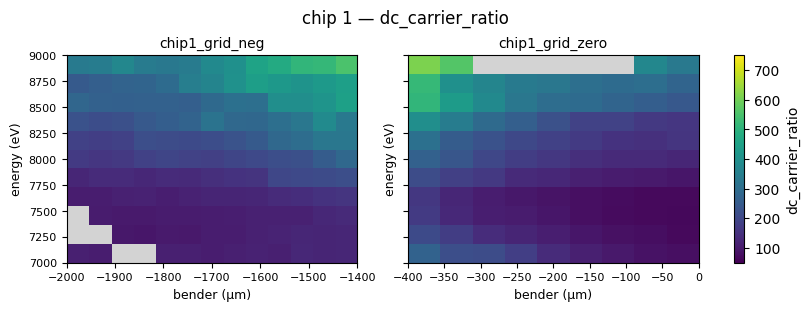

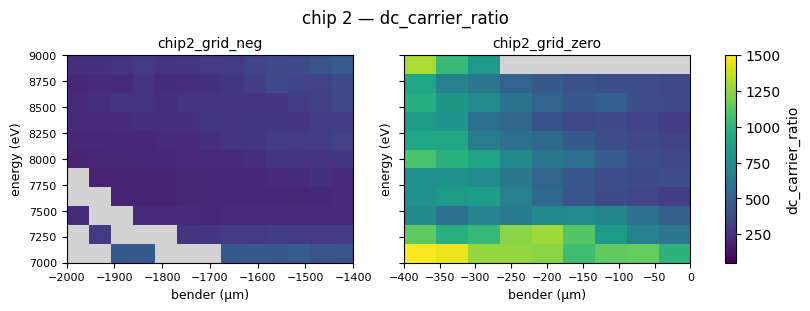

In [95]:
FIELD = 'dc_carrier_ratio'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, vmin=50, vmax=750)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, vmin=50, vmax=750)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, vmin=50, vmax=1500)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, vmin=50, vmax=1500)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

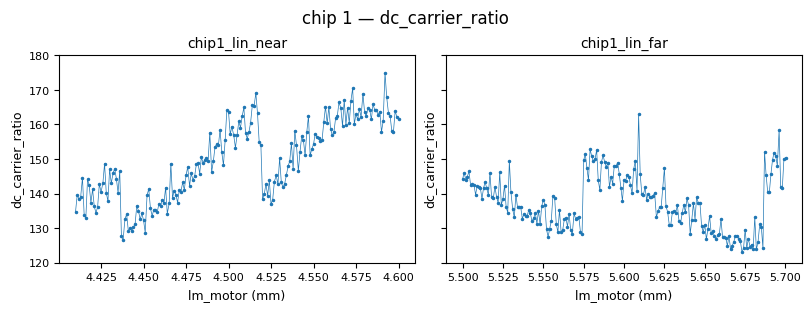

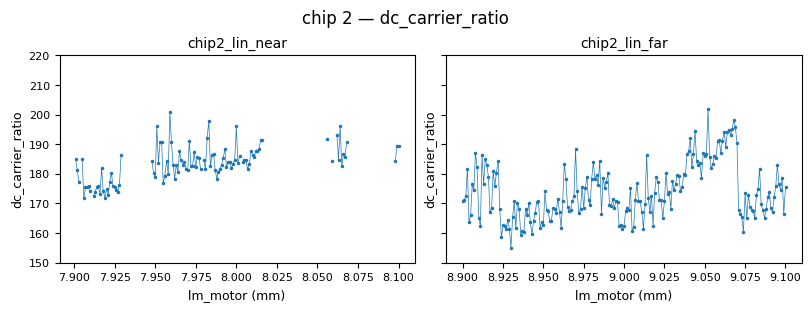

In [82]:
FIELD = 'dc_carrier_ratio'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD)
plot_trace(axes[1], 'chip1_lin_far',  FIELD)
axes[0].set_ylim(120, 180)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD)
plot_trace(axes[1], 'chip2_lin_far',  FIELD)
axes[0].set_ylim(150, 220)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

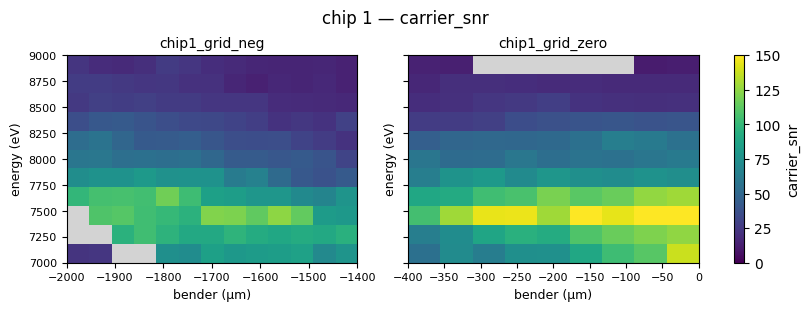

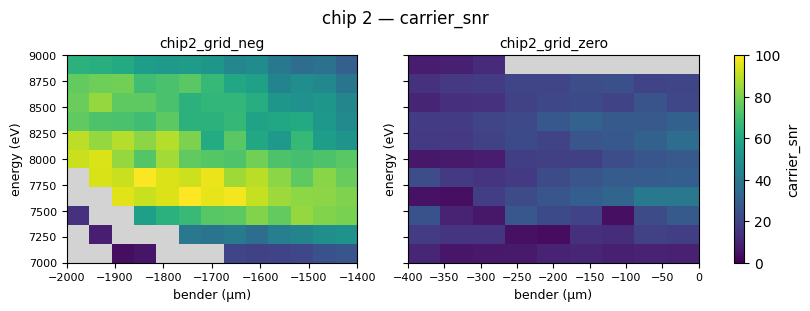

In [98]:
FIELD = 'carrier_snr'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, vmin=0, vmax=150)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, vmin=0, vmax=150)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, vmin=0, vmax=100)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, vmin=0, vmax=100)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

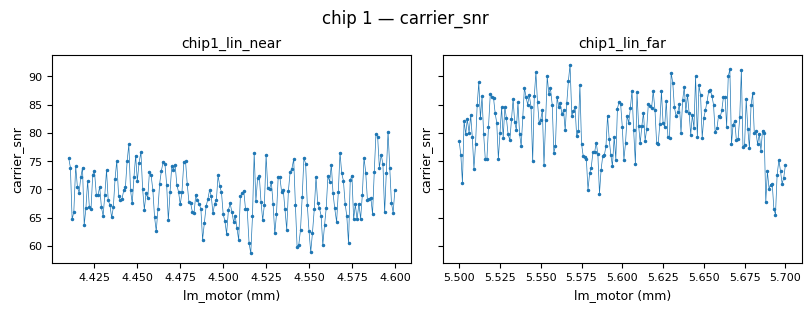

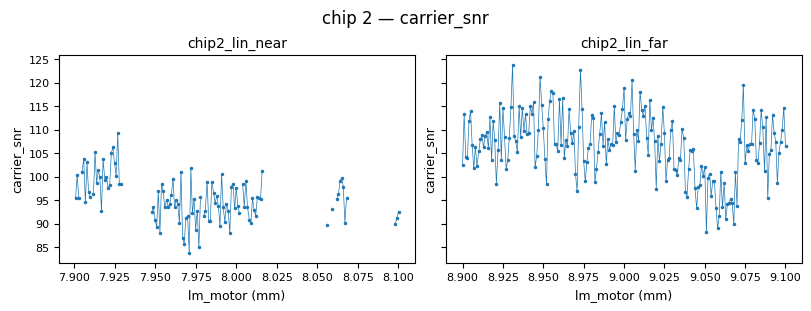

In [88]:
FIELD = 'carrier_snr'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD)
plot_trace(axes[1], 'chip1_lin_far',  FIELD)
# axes[0].set_ylim(55, 95)
fig.suptitle(f"chip 1 — {FIELD}")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD)
plot_trace(axes[1], 'chip2_lin_far',  FIELD)
# axes[0].set_ylim(80, 130)
fig.suptitle(f"chip 2 — {FIELD}")
plt.show()

#### Results

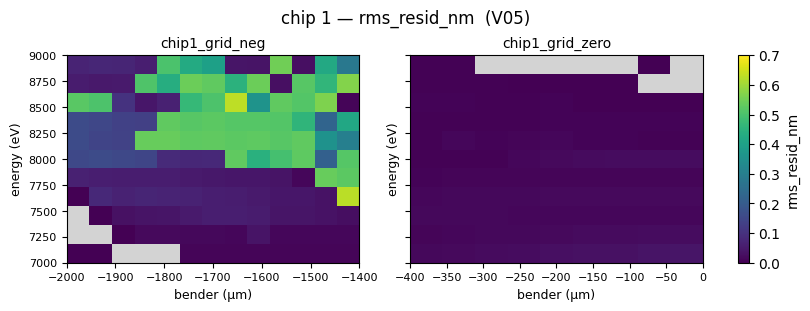

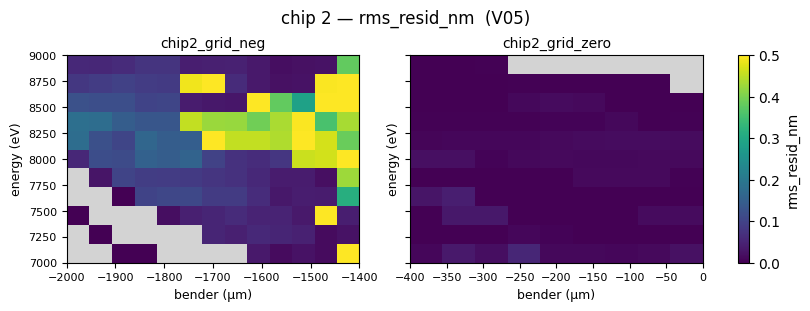

In [99]:
FIELD, TAG_USE = 'rms_resid_nm', TAG

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG_USE})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG_USE})")
plt.show()

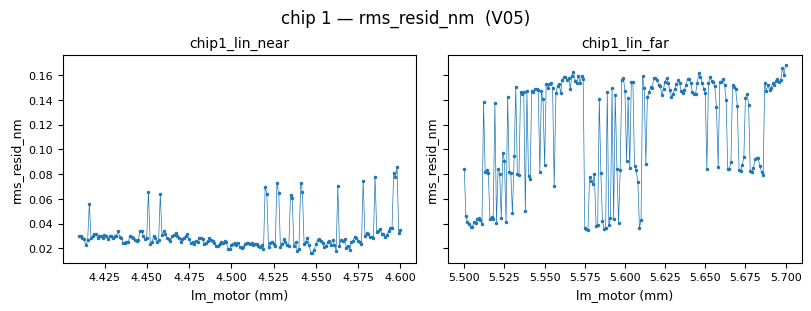

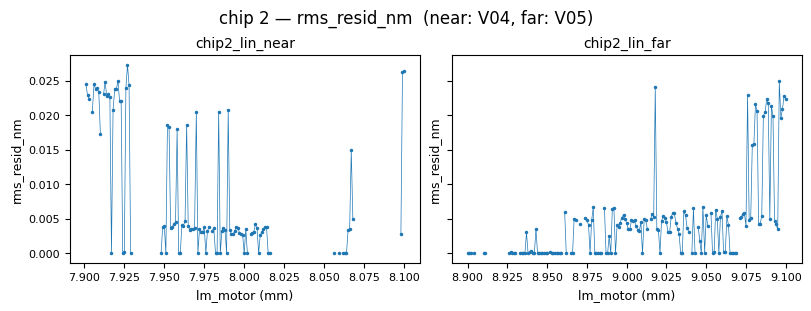

In [100]:
FIELD = 'rms_resid_nm'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
# axes[0].set_ylim(0, 0.18)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near forced to V04 (V05 has no data); far at V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag='V04')
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
# axes[0].set_ylim(0, 0.05)
fig.suptitle(f"chip 2 — {FIELD}  (near: V04, far: {TAG})")
plt.show()

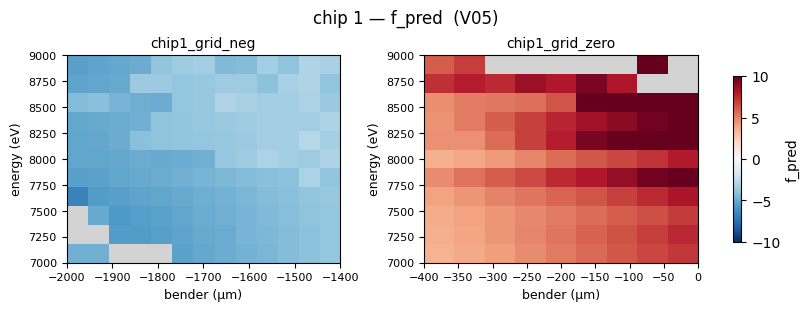

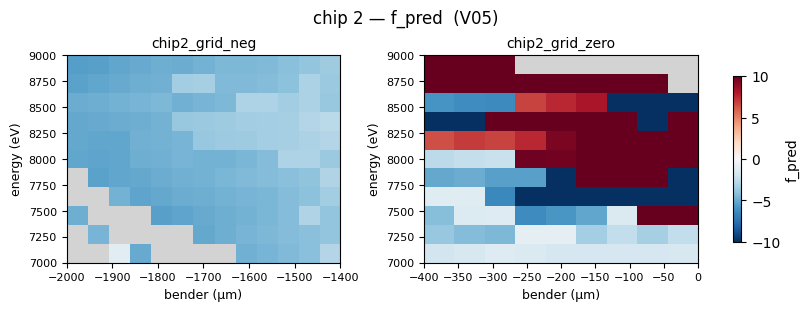

In [114]:
FIELD, TAG = 'f_pred', 'V05'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

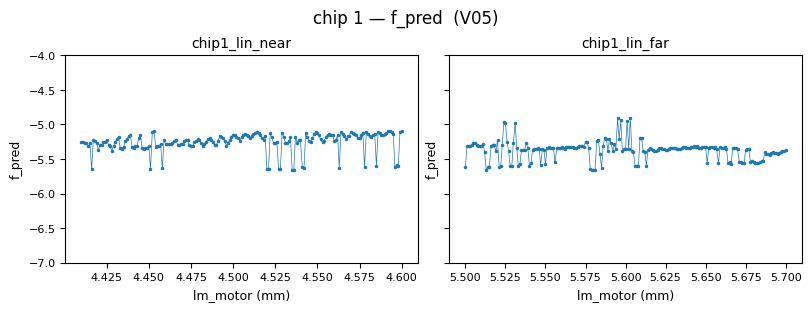

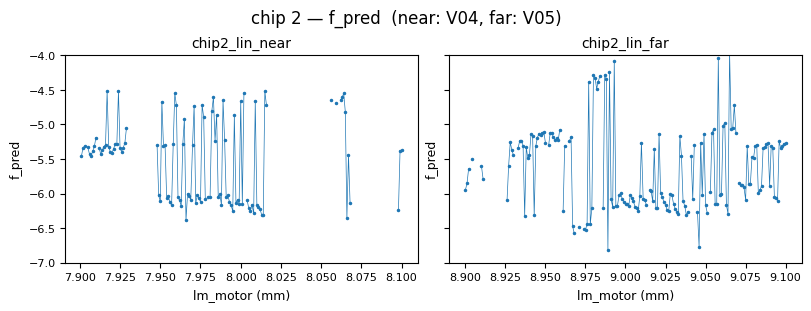

In [105]:
FIELD = 'f_pred'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near V04, far V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag='V04')
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 2 — {FIELD}  (near: V04, far: {TAG})")
plt.show()

##### V_threhold = 0.4

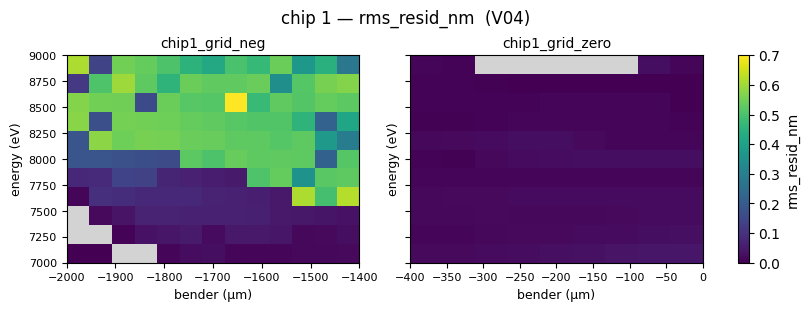

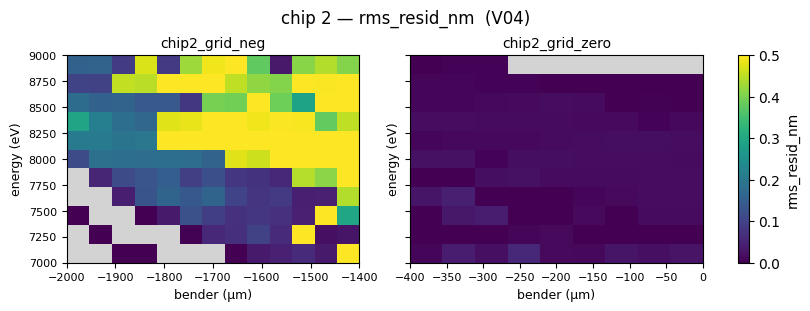

In [108]:
FIELD, TAG_USE = 'rms_resid_nm', 'V04'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.7)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG_USE})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG_USE, vmin=0, vmax=0.5)
fig.colorbar(im, ax=axes, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG_USE})")
plt.show()

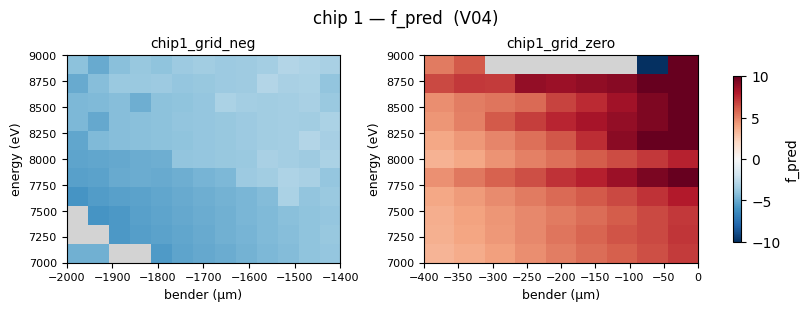

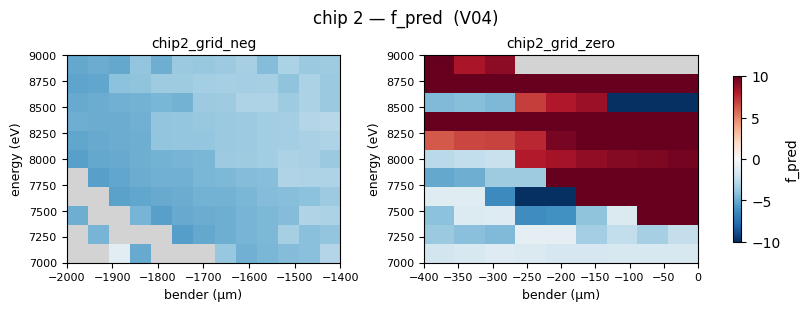

In [112]:
FIELD, TAG = 'f_pred', 'V04'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  FIELD, tag=TAG,
             vmin=-10, vmax=10, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', FIELD, tag=TAG,
                  vmin=-10, vmax=10, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=FIELD)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

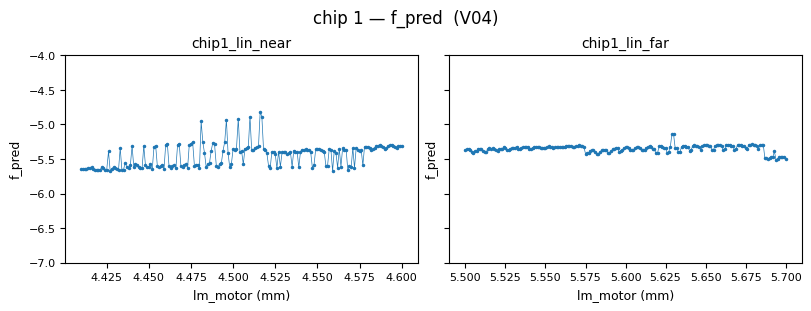

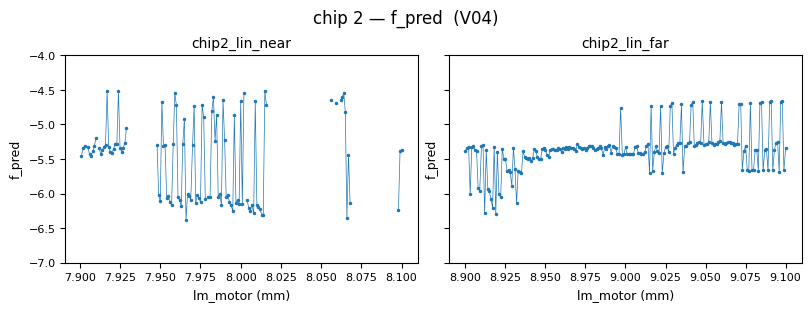

In [118]:
FIELD, TAG = 'f_pred', 'V04'

# chip 1 — both V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip1_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 1 — {FIELD}  ({TAG})")
plt.show()

# chip 2 — near V04, far V05
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', FIELD, tag=TAG)
plot_trace(axes[1], 'chip2_lin_far',  FIELD, tag=TAG)
axes[0].set_ylim(-7, -4)
fig.suptitle(f"chip 2 — {FIELD}  ({TAG})")
plt.show()

##### Comparison between V04 and V05

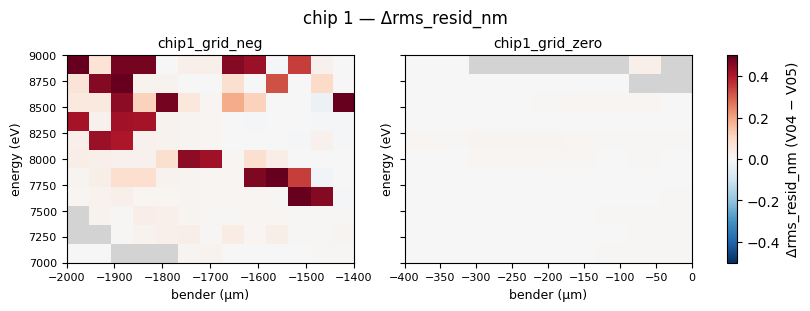

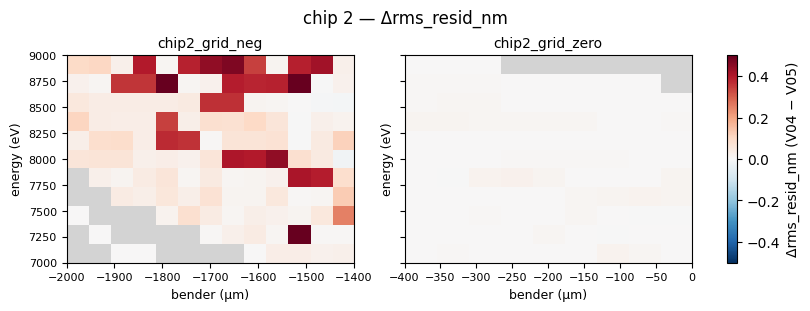

In [127]:
def _delta(key, field):
    """V_thr-pair difference, V04 − V05. NaN where either config failed."""
    return _values(key, field, 'V04') - _values(key, field, 'V05')

LABEL = 'Δrms_resid_nm (V04 − V05)'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  LABEL,
             values=_delta('chip1_grid_neg', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', LABEL,
             values=_delta('chip1_grid_zero', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, label=LABEL)
fig.suptitle("chip 1 — Δrms_resid_nm")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True, sharey=True )
plot_heatmap(axes[0], 'chip2_grid_neg',  LABEL,
             values=_delta('chip2_grid_neg', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', LABEL,
             values=_delta('chip2_grid_zero', 'rms_resid_nm'),
             vmin=-0.5, vmax=0.5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, label=LABEL)
fig.suptitle("chip 2 — Δrms_resid_nm")
plt.show()

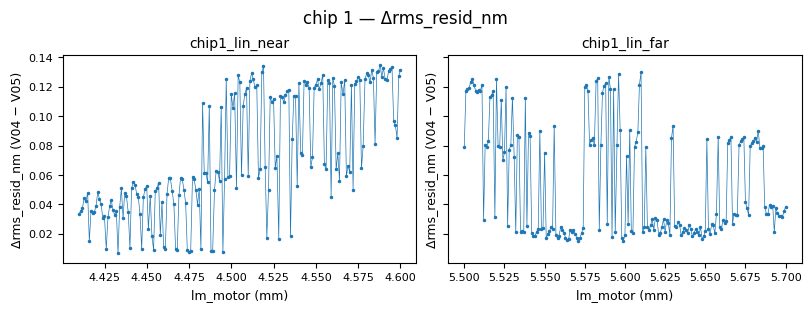

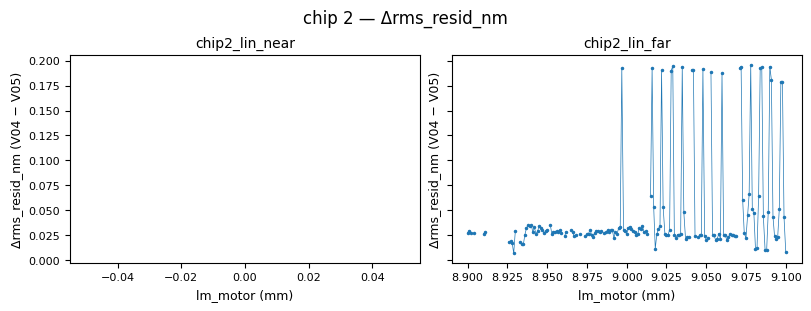

In [125]:
LABEL = 'Δrms_resid_nm (V04 − V05)'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', LABEL,
           values=_delta('chip1_lin_near', 'rms_resid_nm'))
plot_trace(axes[1], 'chip1_lin_far',  LABEL,
           values=_delta('chip1_lin_far',  'rms_resid_nm'))
# axes[0].set_ylim(-0.15, 0.15)
fig.suptitle("chip 1 — Δrms_resid_nm")
plt.show()

# chip 2 — near will be all NaN (V05 dead); plot anyway for symmetry
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', LABEL,
           values=_delta('chip2_lin_near', 'rms_resid_nm'))
plot_trace(axes[1], 'chip2_lin_far',  LABEL,
           values=_delta('chip2_lin_far',  'rms_resid_nm'))
# axes[0].set_ylim(-0.15, 0.15)
fig.suptitle("chip 2 — Δrms_resid_nm")
plt.show()

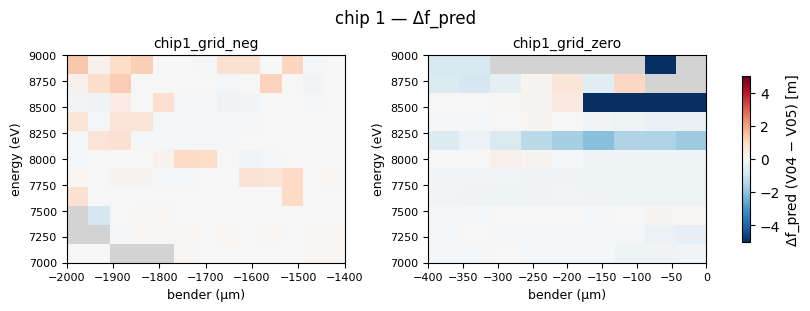

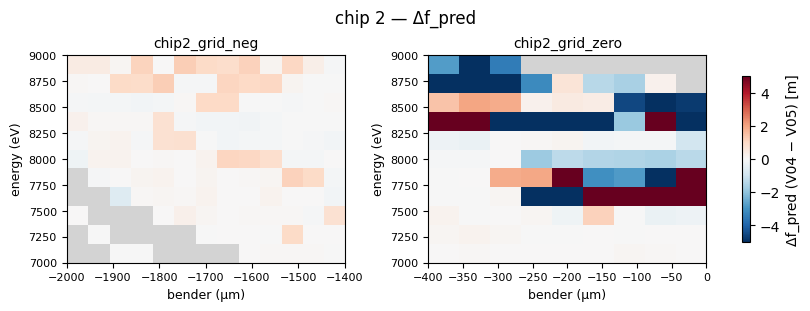

In [132]:
LABEL = 'Δf_pred (V04 − V05) [m]'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip1_grid_neg',  LABEL,
             values=_delta('chip1_grid_neg', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip1_grid_zero', LABEL,
             values=_delta('chip1_grid_zero', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=LABEL)
fig.suptitle("chip 1 — Δf_pred")
plt.show()

# chip 2
fig, axes = plt.subplots(1, 2, figsize=(8, 3), constrained_layout=True)
plot_heatmap(axes[0], 'chip2_grid_neg',  LABEL,
             values=_delta('chip2_grid_neg', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
im = plot_heatmap(axes[1], 'chip2_grid_zero', LABEL,
             values=_delta('chip2_grid_zero', 'f_pred'),
             vmin=-5, vmax=5, cmap_name='RdBu_r')
fig.colorbar(im, ax=axes, shrink=0.8, label=LABEL)
fig.suptitle("chip 2 — Δf_pred")
plt.show()

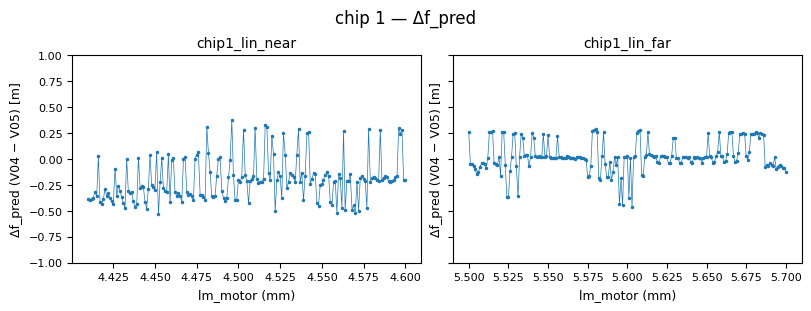

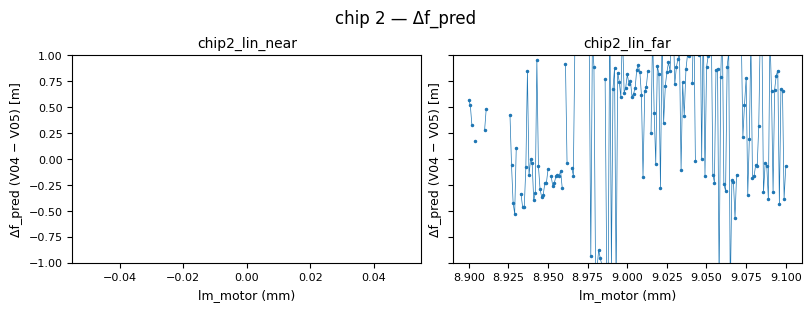

In [133]:
LABEL = 'Δf_pred (V04 − V05) [m]'

# chip 1
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip1_lin_near', LABEL,
           values=_delta('chip1_lin_near', 'f_pred'))
plot_trace(axes[1], 'chip1_lin_far',  LABEL,
           values=_delta('chip1_lin_far',  'f_pred'))
axes[0].set_ylim(-1, 1)
fig.suptitle("chip 1 — Δf_pred")
plt.show()

# chip 2 — near all NaN as in D5b
fig, axes = plt.subplots(1, 2, figsize=(8, 3),
                         constrained_layout=True, sharey=True)
plot_trace(axes[0], 'chip2_lin_near', LABEL,
           values=_delta('chip2_lin_near', 'f_pred'))
plot_trace(axes[1], 'chip2_lin_far',  LABEL,
           values=_delta('chip2_lin_far',  'f_pred'))
axes[0].set_ylim(-1, 1)
fig.suptitle("chip 2 — Δf_pred")
plt.show()

##### Quick visual inspection for irregularity


In [141]:
def preview_frame(key, idx):
    """Image with .T + y_roi overlay, plus the 1D fringe profile.
    Returns (image, y_roi, wavelength, label, info) for the cell to feed
    into quick_look or reconstruct_single."""
    images, meta, info = get_scan(key)
    chip  = info['chip']
    y_roi = CHIP_DEFAULTS[chip]['y_roi']
    if 'mono_energy_eV' in meta:
        E_eV = float(meta['mono_energy_eV'][idx])
    else:
        E_eV = float(info['fixed']['mono_energy'])
    wavelength = wfl.energy_eV_to_wavelength_m(E_eV)
    label = frame_label(key, idx, meta, info)
    image = images[idx]

    fig, (ax_img, ax_prof) = plt.subplots(
        2, 1, figsize=(11, 6),
        gridspec_kw={'height_ratios': [3, 1]},
        constrained_layout=True,
    )
    ax_img.imshow(image.T, aspect='auto', cmap='hot')
    ax_img.axhline(y_roi.start, color='cyan', lw=0.8)
    ax_img.axhline(y_roi.stop,  color='cyan', lw=0.8)
    ax_img.set(title=f"{label}    y_roi={y_roi}",
               xlabel='x [px]', ylabel='y [px]')

    profile = wfl.extract_profile(image, y_roi, axis=1)
    ax_prof.plot(profile, lw=0.7)
    ax_prof.set(xlabel='x [px]', ylabel='intensity',
                title='1D profile at locked y_roi')
    plt.show()

    return image, y_roi, wavelength, label, info

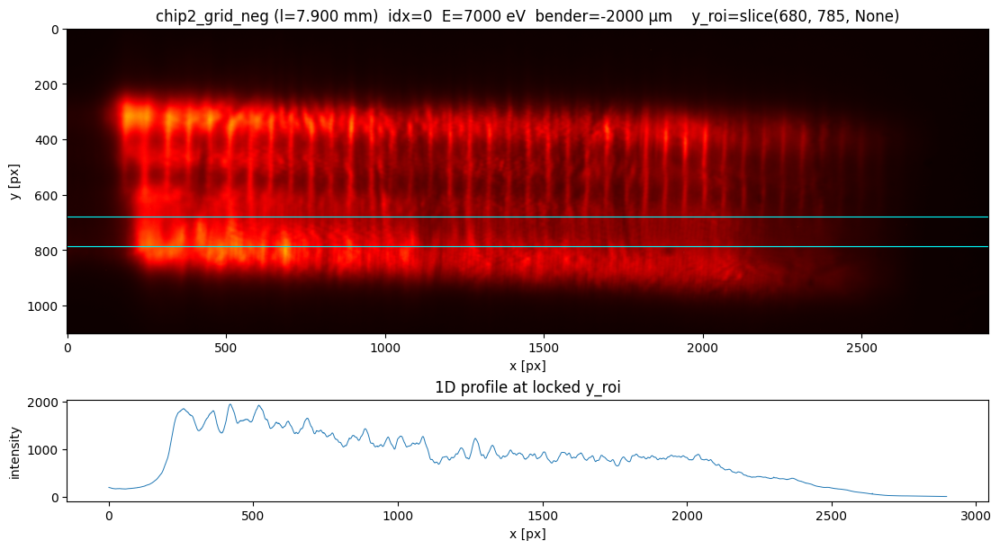

V_thr=0.4 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
V_thr=0.5 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.


In [142]:
image, y_roi, wavelength, label, info = preview_frame('chip2_grid_neg', 0)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

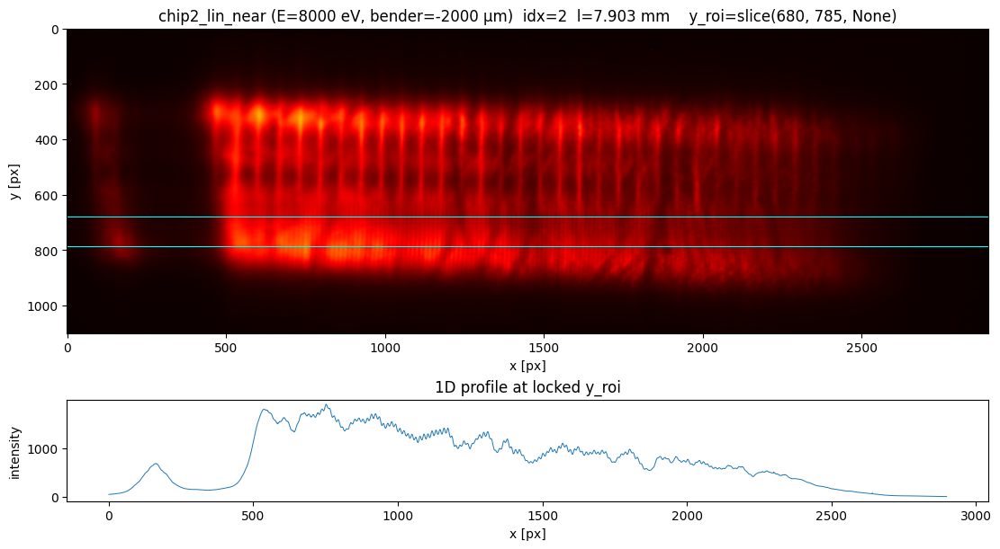

[  ok]  λ=0.15nm  k_peak=153.0 cyc/mm  r_DC=177.3  SNR=95.4  f_pred=-5.31m  RMS_W=10.7nm  RMS_resid=0.022nm


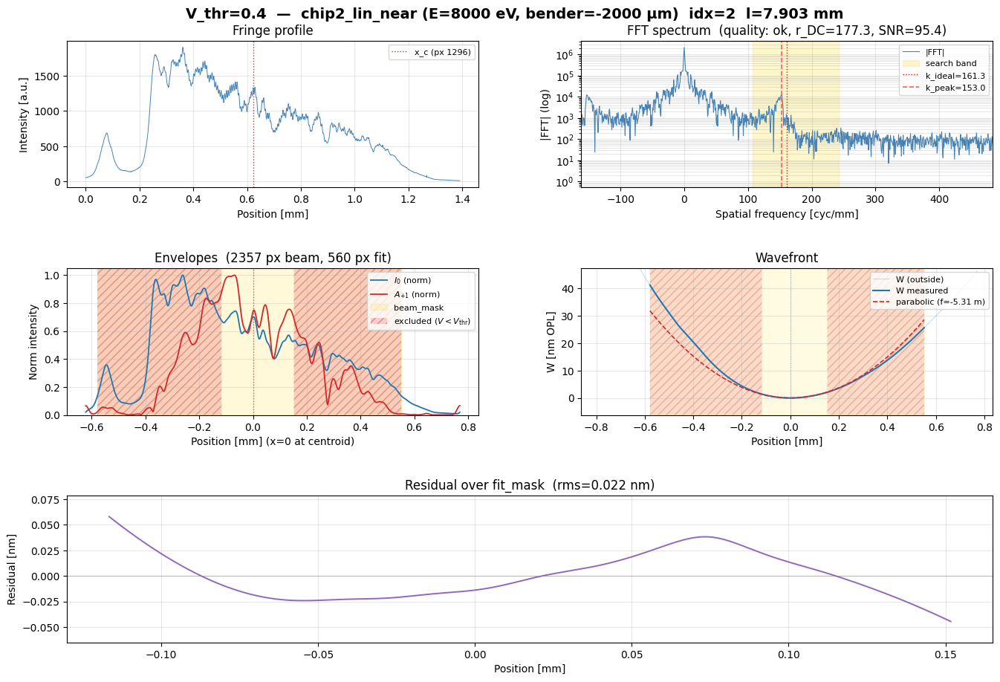

V_thr=0.5 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.


In [143]:
image, y_roi, wavelength, label, info = preview_frame('chip2_lin_near', 2)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

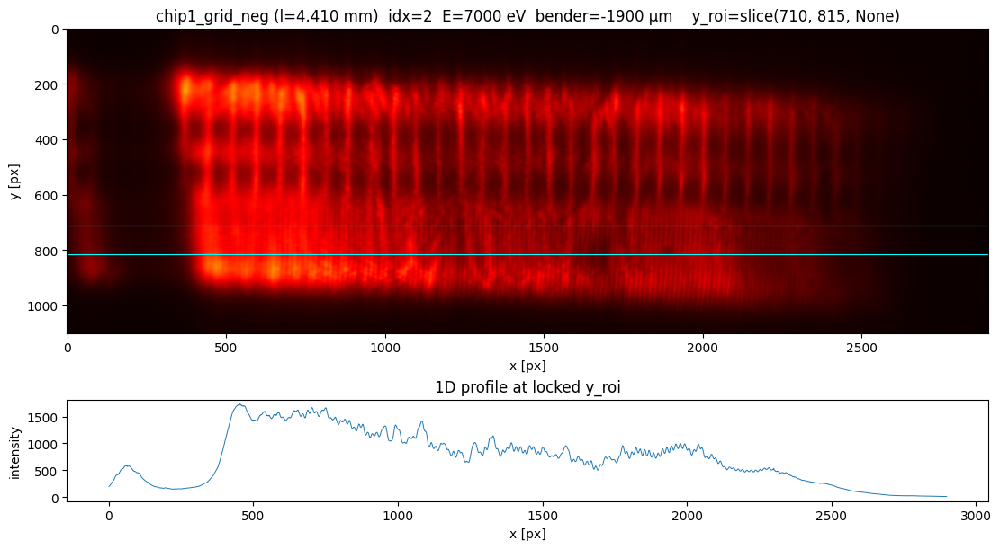

V_thr=0.4 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
V_thr=0.5 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.


In [144]:
image, y_roi, wavelength, label, info = preview_frame('chip1_grid_neg', 2)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

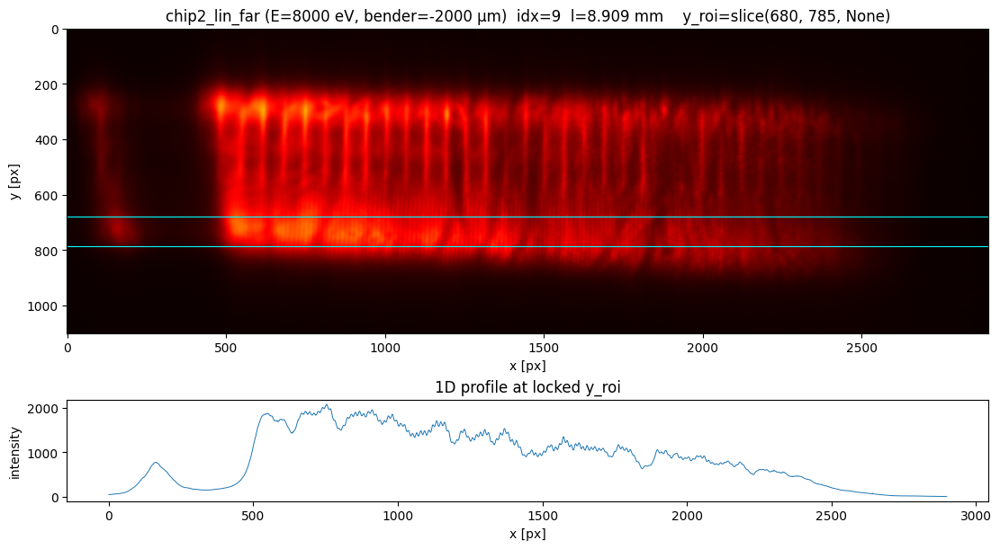

[  ok]  λ=0.15nm  k_peak=153.0 cyc/mm  r_DC=182.4  SNR=102.3  f_pred=-5.96m  RMS_W=10.9nm  RMS_resid=0.005nm


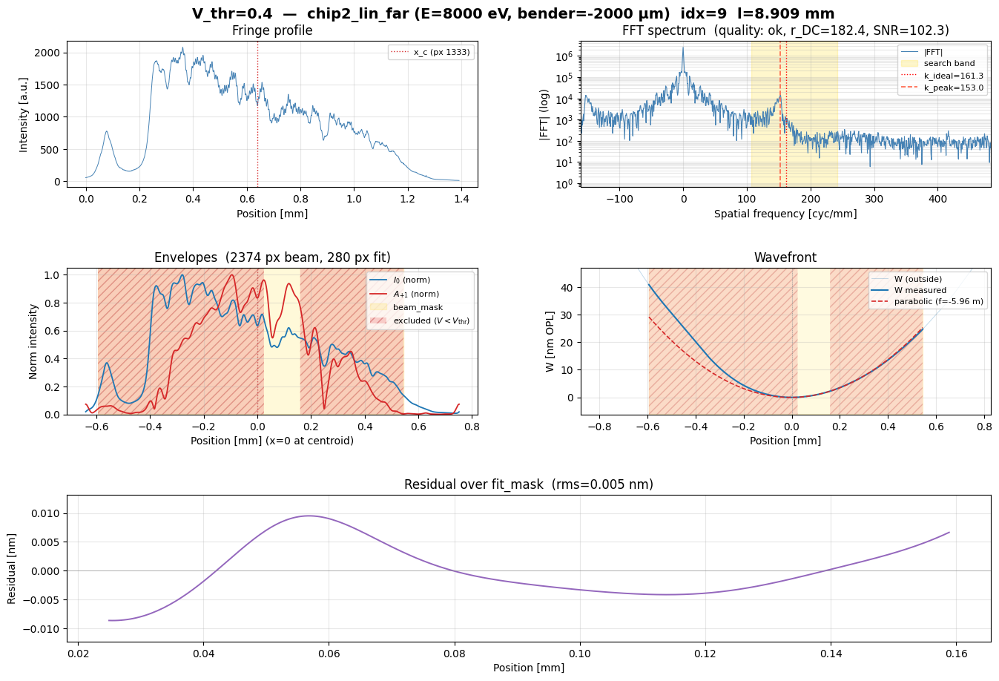

V_thr=0.5 failed: ValueError: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.


In [145]:
image, y_roi, wavelength, label, info = preview_frame('chip2_lin_far', 9)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

chip1_grid_zero: idx=97  |Δf_pred|=104.237 m


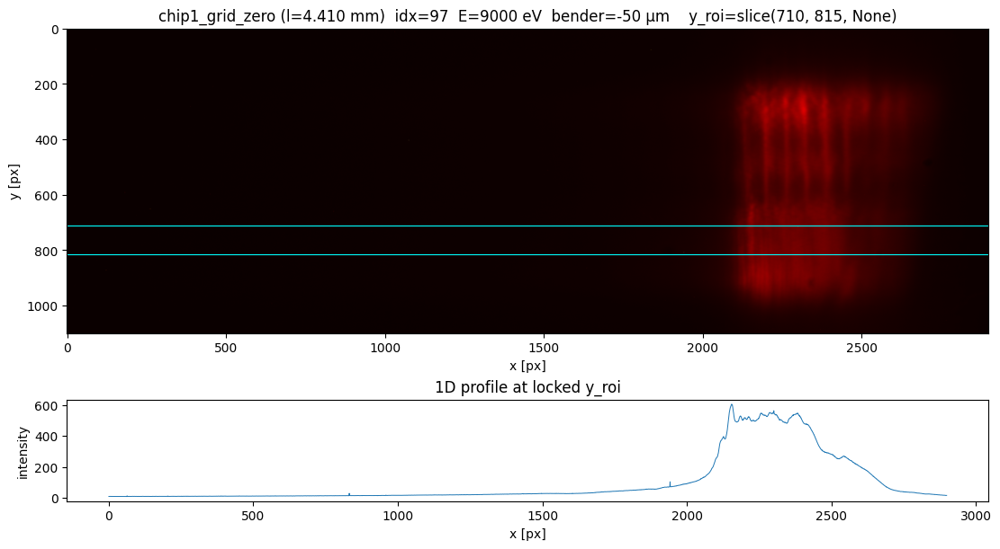

[ bad]  λ=0.14nm  k_peak=146.6 cyc/mm  r_DC=373.0  SNR=11.2  f_pred=-79.11m  RMS_W=0.6nm  RMS_resid=0.025nm


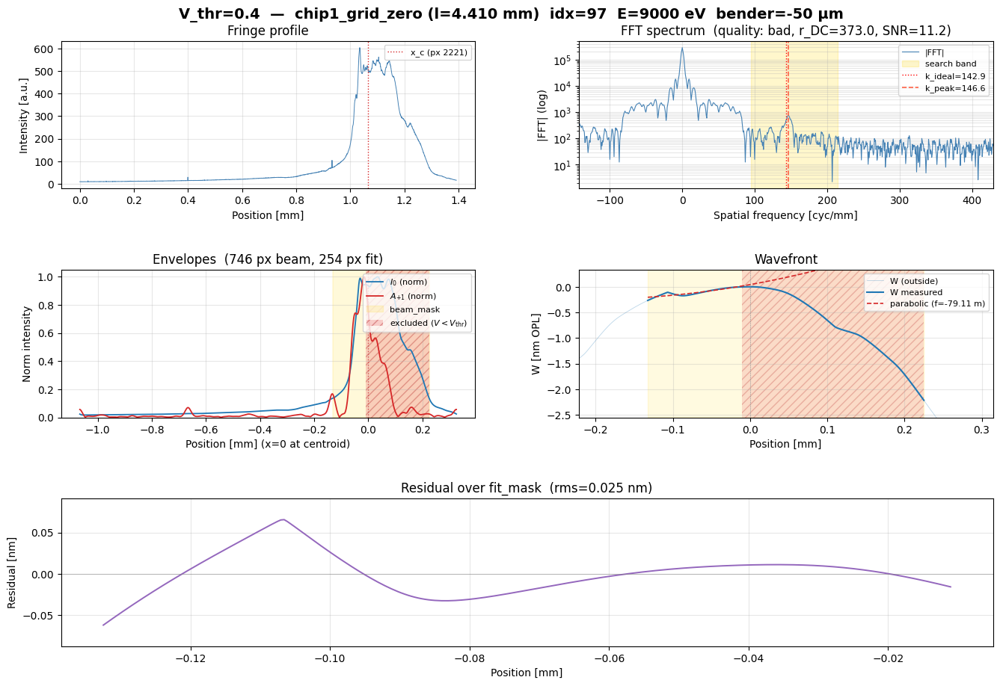

/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py:1048: RuntimeWarning: parabolic_focal_fit: mask has only 17 pixels (< n_min_fit=50). Fit may be unreliable.
  fit = parabolic_focal_fit(wfr['W_rad'], wfr['x_m'], wavelength,


[ bad]  λ=0.14nm  k_peak=146.6 cyc/mm  r_DC=373.0  SNR=11.2  f_pred=+25.13m  RMS_W=0.6nm  RMS_resid=0.000nm


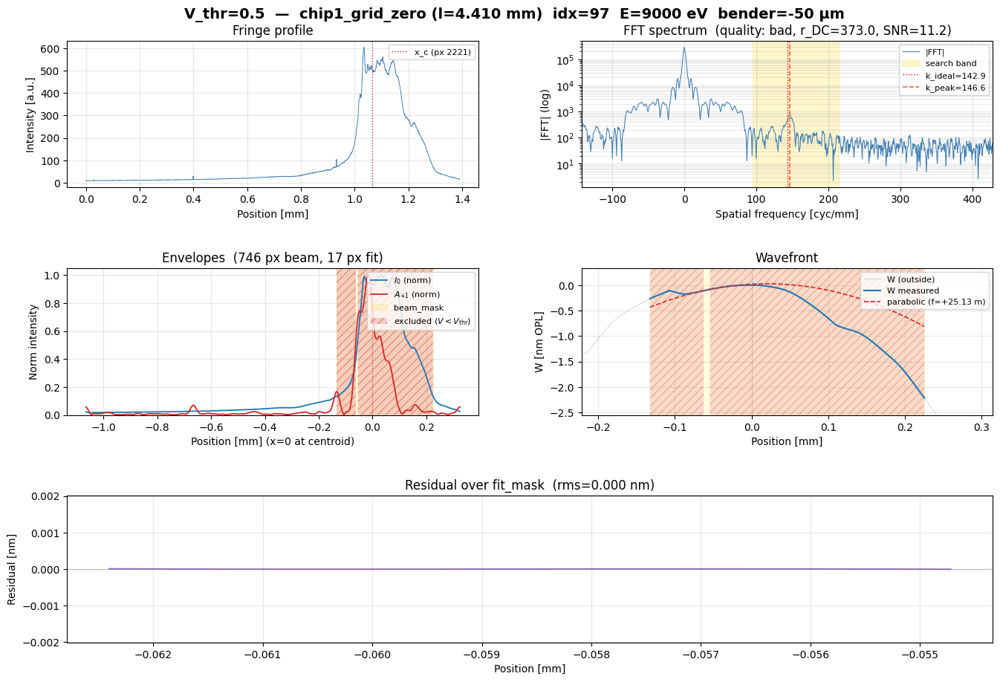

In [146]:
key = 'chip1_grid_zero'
delta = np.array([
    (r['configs']['V04']['f_pred'] - r['configs']['V05']['f_pred'])
    if r['configs']['V04']['fit_status'] == 'ok'
       and r['configs']['V05']['fit_status'] == 'ok'
    else np.nan
    for r in RESULTS[key]
])
idx = int(np.nanargmax(np.abs(delta)))
print(f"{key}: idx={idx}  |Δf_pred|={abs(delta[idx]):.3f} m")

image, y_roi, wavelength, label, info = preview_frame(key, idx)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

chip2_grid_zero: idx=64  |Δf_pred|=8575.853 m


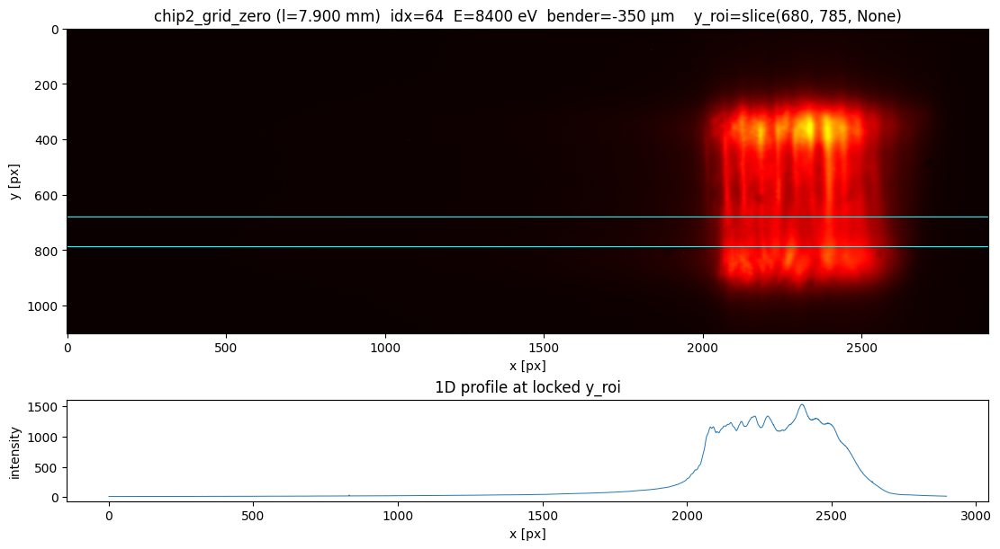

[ bad]  λ=0.15nm  k_peak=167.4 cyc/mm  r_DC=809.8  SNR=17.5  f_pred=+11.70m  RMS_W=0.7nm  RMS_resid=0.016nm


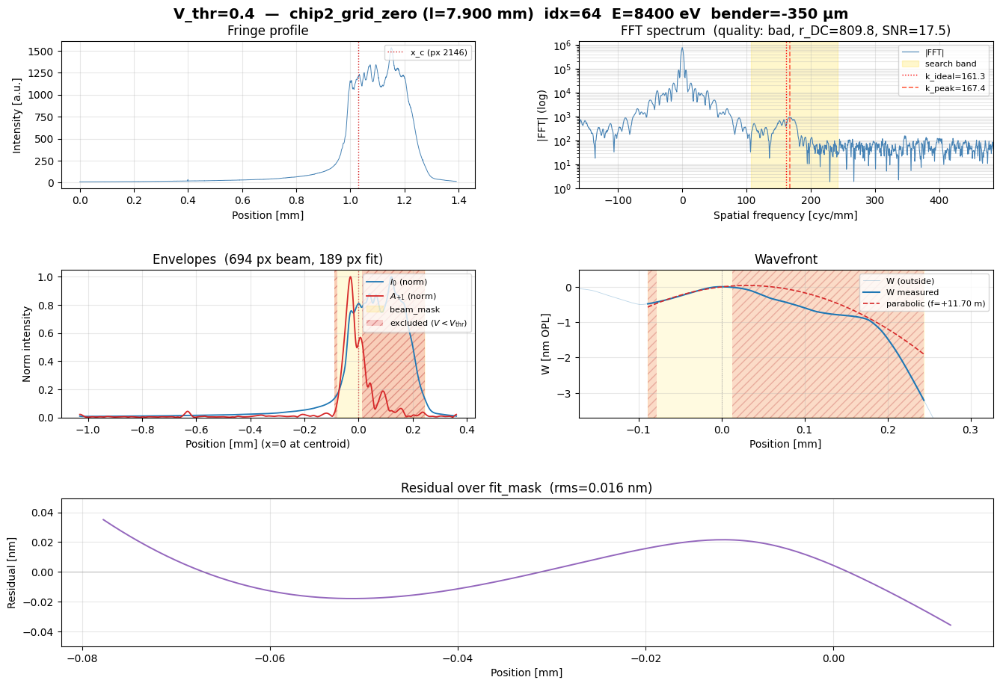

[ bad]  λ=0.15nm  k_peak=167.4 cyc/mm  r_DC=809.8  SNR=17.5  f_pred=-8564.15m  RMS_W=0.7nm  RMS_resid=0.003nm


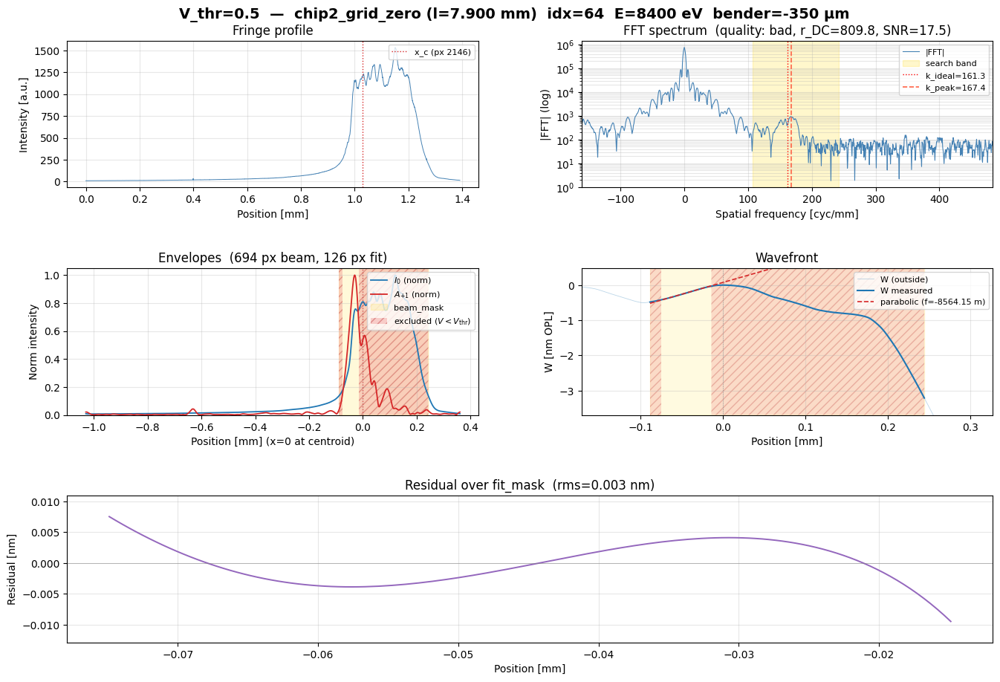

In [147]:
key = 'chip2_grid_zero'
delta = np.array([
    (r['configs']['V04']['f_pred'] - r['configs']['V05']['f_pred'])
    if r['configs']['V04']['fit_status'] == 'ok'
       and r['configs']['V05']['fit_status'] == 'ok'
    else np.nan
    for r in RESULTS[key]
])
idx = int(np.nanargmax(np.abs(delta)))
print(f"{key}: idx={idx}  |Δf_pred|={abs(delta[idx]):.3f} m")

image, y_roi, wavelength, label, info = preview_frame(key, idx)

for V_thr in [0.4, 0.5]:
    try:
        wfl.quick_look(
            image,
            dx=info['dx_m'], grating_pitch=info['grating_pitch_m'],
            wavelength=wavelength, z_gd=Z_GD_M,
            y_roi=y_roi, V_threshold=V_thr,
            title=f"V_thr={V_thr}  —  {label}",
        )
    except Exception as e:
        print(f"V_thr={V_thr} failed: {type(e).__name__}: {e}")

##### Summary stats

__Indicator only.__ 
Per-scan medians and failure counts from `RESULTS`. Numbers are dominated by bad sub-regions (especially `grid_zero` and `chip2_lin_near`) and are **not** a quality benchmark — they exist as a baseline for cross-session comparison only.

In [135]:
def _med(recs, field, tag=None):
    if tag is None:
        v = np.array([r.get(field, np.nan) for r in recs], dtype=float)
    else:
        v = np.array([r['configs'][tag][field] for r in recs], dtype=float)
    return float(np.nanmedian(v)) if np.isfinite(v).any() else np.nan

def _n_fail(recs, tag):
    return sum(r['configs'][tag]['fit_status'] == 'fail' for r in recs)

def _n_fail_both(recs):
    return sum(all(r['configs'][t]['fit_status'] == 'fail' for t in V_CONFIGS)
               for r in recs)

hdr = (f"{'scan':<18s} {'n':>4s} "
       f"{'failV04':>8s} {'failV05':>8s} {'failBoth':>9s} "
       f"{'r_DC':>6s} {'snr':>6s} "
       f"{'rmsV04':>7s} {'rmsV05':>7s} "
       f"{'fV04':>7s} {'fV05':>7s}")
print(hdr)
print("-" * len(hdr))
for key, recs in RESULTS.items():
    print(f"{key:<18s} {len(recs):>4d} "
          f"{_n_fail(recs, 'V04'):>8d} {_n_fail(recs, 'V05'):>8d} "
          f"{_n_fail_both(recs):>9d} "
          f"{_med(recs, 'dc_carrier_ratio'):>6.0f} "
          f"{_med(recs, 'carrier_snr'):>6.1f} "
          f"{_med(recs, 'rms_resid_nm', 'V04'):>7.3f} "
          f"{_med(recs, 'rms_resid_nm', 'V05'):>7.3f} "
          f"{_med(recs, 'f_pred',       'V04'):>+7.2f} "
          f"{_med(recs, 'f_pred',       'V05'):>+7.2f}")

scan                  n  failV04  failV05  failBoth   r_DC    snr  rmsV04  rmsV05    fV04    fV05
-------------------------------------------------------------------------------------------------
chip1_grid_neg      143        5        6         5    204   42.7   0.374   0.075   -4.09   -4.34
chip1_grid_zero      99        5        8         5    169   60.2   0.015   0.010   +6.11   +6.28
chip1_lin_near      191        0        0         0    149   68.9   0.084   0.027   -5.40   -5.23
chip1_lin_far       201        0        0         0    137   81.7   0.169   0.145   -5.34   -5.35
chip2_grid_neg      143       14       17        14    259   69.4   0.185   0.088   -4.24   -4.60
chip2_grid_zero      99        6        7         6    653   19.3   0.012   0.003   +6.93   -1.33
chip2_lin_near      200       94      200        94    183   95.3   0.004     nan   -5.39    +nan
chip2_lin_far       201        0       36         0    172  107.0   0.029   0.004   -5.35   -5.86


##### Script test (temp)

In [149]:
import importlib
import wfs_live as wfl
importlib.reload(wfl)

<module 'wfs_live' from '/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py'>

In [150]:
# T1 — success-path regression after A1–A5
# Confirms no behavior change on healthy frames.
# Locked targets from session_summary_20260613.md:
#   chip1_grid_neg idx=67, V_thr=0.5 → rms_resid_nm = 0.153
#   chip2_grid_neg idx=67, V_thr=0.5 → rms_resid_nm = 0.115

EXPECTED = {
    'chip1_grid_neg': 0.153,
    'chip2_grid_neg': 0.115,
}

print(f"{'scan':<18} {'fit_status':>10} {'rms_resid_nm':>14} {'expected':>10}  result")
print('-' * 70)
for key, rms_expected in EXPECTED.items():
    r = reco_frame(key, 67)   # V_thr=0.5 from CHIP_DEFAULTS, no propagation
    rms = r['rms_resid_nm']
    status = r['fit_status']
    reason = r['fit_fail_reason']
    f_pred_finite = np.isfinite(r['f_pred'])

    ok_status = (status == 'ok') and (reason == '') and f_pred_finite
    ok_rms    = abs(rms - rms_expected) < 5e-4   # 3-decimal match
    verdict   = 'PASS' if (ok_status and ok_rms) else 'FAIL'

    print(f"{key:<18} {status:>10} {rms:>14.3f} {rms_expected:>10.3f}  {verdict}")

scan               fit_status   rms_resid_nm   expected  result
----------------------------------------------------------------------
chip1_grid_neg             ok          0.153      0.153  PASS
chip2_grid_neg             ok          0.115      0.115  PASS


In [152]:
# T2 (simplified) — fail path, no propagation
# chip2_grid_neg idx=0 fails the parabolic fit at V_thr=0.5.
# Before A1+A2: ValueError raised, no result returned.
# After:        result returned with fit_status='fail' and NaN sentinels.

r = reco_frame('chip2_grid_neg', 0, V_threshold=0.5, propagate=False)

print(f"fit_status       : {r['fit_status']}")
print(f"fit_fail_reason  : {r['fit_fail_reason']}")
print(f"f_pred           : {r['f_pred']}")
print(f"rms_resid_nm     : {r['rms_resid_nm']}")
print(f"dc_carrier_ratio : {r['dc_carrier_ratio']:.1f}")
print(f"carrier_snr      : {r['carrier_snr']:.1f}")
print(f"quality          : {r['quality']}")
print(f"W_rad shape, any NaN : {r['W_rad'].shape}, {np.any(np.isnan(r['W_rad']))}")

fit_status       : fail
fit_fail_reason  : parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
f_pred           : nan
rms_resid_nm     : nan
dc_carrier_ratio : 455.2
carrier_snr      : 14.7
quality          : bad
W_rad shape, any NaN : (2900,), False


In [153]:
# T2 (simplified) — fail path, no propagation
# chip2_grid_neg idx=0 fails the parabolic fit at V_thr=0.5.
# Before A1+A2: ValueError raised, no result returned.
# After:        result returned with fit_status='fail' and NaN sentinels.

r = reco_frame('chip2_grid_neg', 2, V_threshold=0.5, propagate=False)

print(f"fit_status       : {r['fit_status']}")
print(f"fit_fail_reason  : {r['fit_fail_reason']}")
print(f"f_pred           : {r['f_pred']}")
print(f"rms_resid_nm     : {r['rms_resid_nm']}")
print(f"dc_carrier_ratio : {r['dc_carrier_ratio']:.1f}")
print(f"carrier_snr      : {r['carrier_snr']:.1f}")
print(f"quality          : {r['quality']}")
print(f"W_rad shape, any NaN : {r['W_rad'].shape}, {np.any(np.isnan(r['W_rad']))}")

fit_status       : ok
fit_fail_reason  : 
f_pred           : -1.08443745597656
rms_resid_nm     : 2.5667307635759526e-06
dc_carrier_ratio : 441.3
carrier_snr      : 3.7
quality          : bad
W_rad shape, any NaN : (2900,), False


/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/wfs_live.py:1065: RuntimeWarning: parabolic_focal_fit: mask has only 32 pixels (< n_min_fit=50). Fit may be unreliable.
  fit = parabolic_focal_fit(wfr['W_rad'], wfr['x_m'], wavelength,


In [154]:
# T2 (simplified) — fail path, no propagation
# chip2_grid_neg idx=0 fails the parabolic fit at V_thr=0.5.
# Before A1+A2: ValueError raised, no result returned.
# After:        result returned with fit_status='fail' and NaN sentinels.

r = reco_frame('chip2_lin_near', 2, V_threshold=0.5, propagate=False)

print(f"fit_status       : {r['fit_status']}")
print(f"fit_fail_reason  : {r['fit_fail_reason']}")
print(f"f_pred           : {r['f_pred']}")
print(f"rms_resid_nm     : {r['rms_resid_nm']}")
print(f"dc_carrier_ratio : {r['dc_carrier_ratio']:.1f}")
print(f"carrier_snr      : {r['carrier_snr']:.1f}")
print(f"quality          : {r['quality']}")
print(f"W_rad shape, any NaN : {r['W_rad'].shape}, {np.any(np.isnan(r['W_rad']))}")

fit_status       : fail
fit_fail_reason  : parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
f_pred           : nan
rms_resid_nm     : nan
dc_carrier_ratio : 177.3
carrier_snr      : 95.4
quality          : ok
W_rad shape, any NaN : (2900,), False


In [168]:
SCANS['chip2_grid_neg'][0][67]

array([[16, 12, 15, ..., 16, 16, 16],
       [ 8, 14, 14, ..., 14, 13, 12],
       [16, 14, 13, ..., 15, 15, 13],
       ...,
       [10, 14, 17, ...,  7, 13, 11],
       [17, 19, 15, ..., 10,  8, 11],
       [17, 16, 15, ...,  9, 10, 11]], shape=(2900, 1100), dtype=uint16)

fit_status    : ok
f_pred        : -5.181 m
z_focus       : -5.421 m   locator=fwhm_min
focus_at_edge : False
rms_at_focus  : 0.081 nm
rms_resid     : 0.115 nm  (expect 0.115)


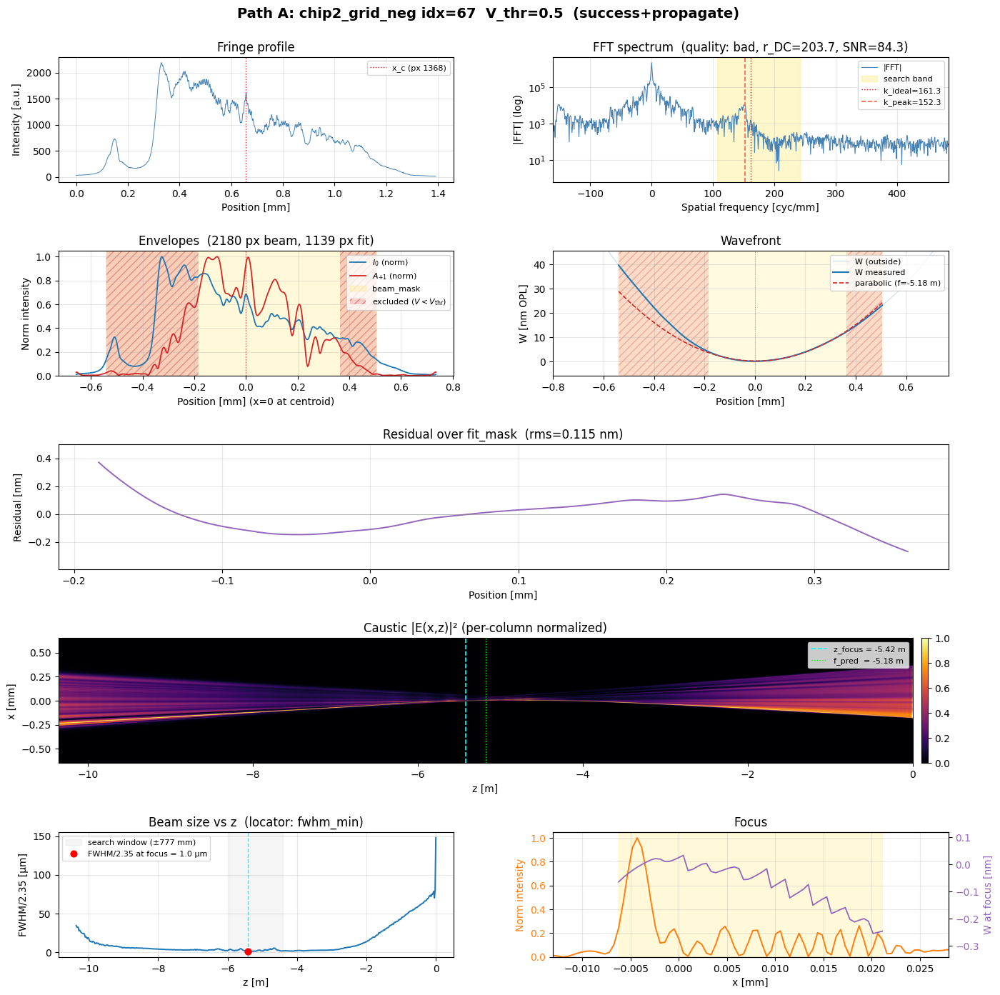

In [170]:
r = reco_frame('chip2_grid_neg', 67, propagate=True)

print(f"fit_status    : {r['fit_status']}")
print(f"f_pred        : {r['f_pred']:+.3f} m")
print(f"z_focus       : {r['z_focus']:+.3f} m   locator={r['z_focus_locator']}")
print(f"focus_at_edge : {r['focus_at_edge']}")
print(f"rms_at_focus  : {r['rms_at_focus_nm']:.3f} nm")
print(f"rms_resid     : {r['rms_resid_nm']:.3f} nm  (expect 0.115)")

_ = wfl.plot_result(r, title='Path A: chip2_grid_neg idx=67  V_thr=0.5  (success+propagate)')

/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/monoplus.py:222: RuntimeWarning: invalid value encountered in divide
  I_z = np.abs(E[:,i_z] **2)/np.max(np.abs(E[:,i_z] **2))
/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/monoplus.py:222: RuntimeWarning: invalid value encountered in divide
  I_z = np.abs(E[:,i_z] **2)/np.max(np.abs(E[:,i_z] **2))
/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/monoplus.py:222: RuntimeWarning: invalid value encountered in divide
  I_z = np.abs(E[:,i_z] **2)/np.max(np.abs(E[:,i_z] **2))
/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/monoplus.py:222: RuntimeWarning: invalid value encountered in divide
  I_z = np.abs(E[:,i_z] **2)/np.max(np.abs(E[:,i_z] **2))
/Users/francisho/Library/CloudStorage/OneDrive-UCSanDiego/Research/Projects/nabla/wfs-als531/monoplus.py:222: RuntimeWar

[ bad]  λ=0.18nm  k_peak=153.0 cyc/mm  r_DC=455.2  SNR=14.7  f_pred=+nanm  RMS_W=8.4nm  RMS_resid=nannm  z_focus=-10.00m(fwhm_min) *EDGE*  RMS@focus=nannm  *FIT FAIL: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.*  *FOCUS FAIL: Empty focus mask — lower threshold or check propagation result.*

fit_status        : fail
fit_fail_reason   : parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
focus_status      : fail
focus_fail_reason : Empty focus mask — lower threshold or check propagation result.
f_pred            : nan
z_focus           : -10.000 m   (step-7 should be finite)
sigma_focus       : nan     (step-7 should be finite)
rms_at_focus_nm   : nan  (step-8 sentinel: NaN)
focus_mask.any()  : False  (step-8 sentinel: False)
W_rad has NaN     : False  (upstream: False)


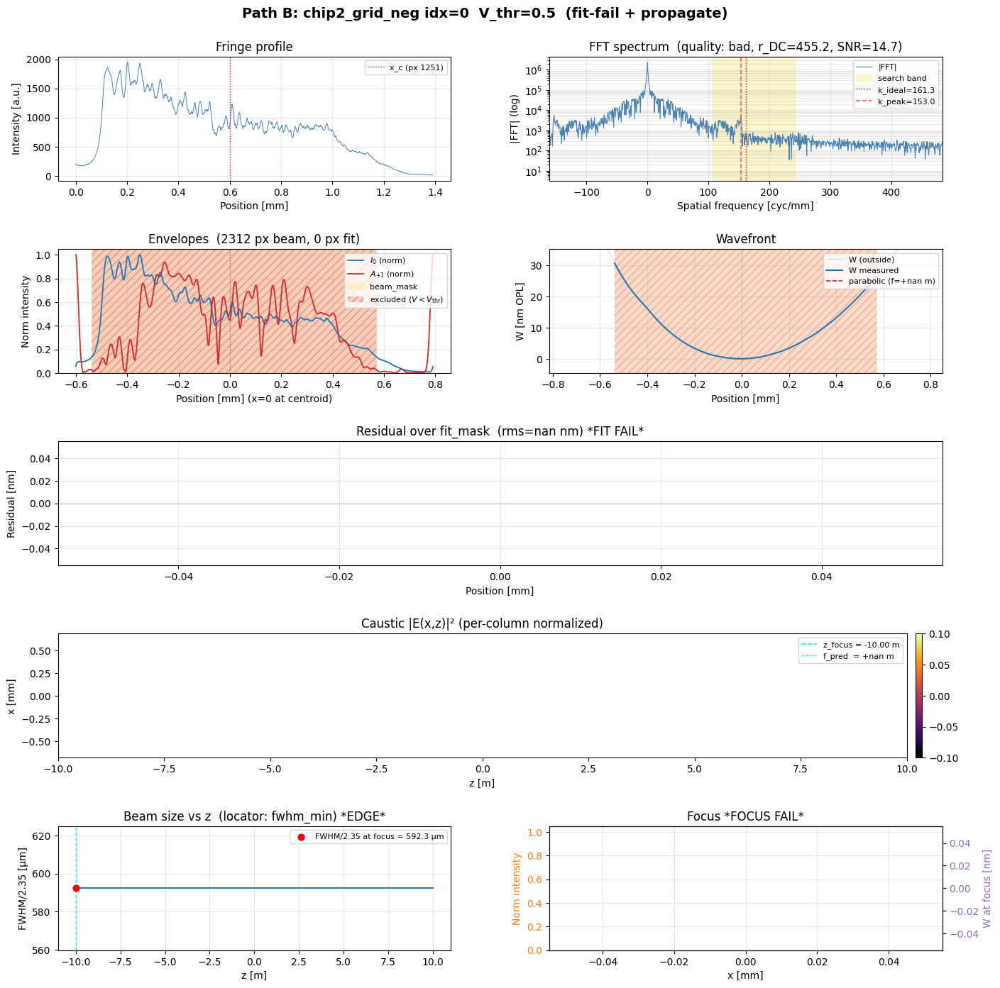

In [172]:
import importlib
import wfs_live as wfl
importlib.reload(wfl)
# If reco_frame closes over wfl.reconstruct_single by name (not module),
# re-run its definition cell after the reload before this one.

r = reco_frame('chip2_grid_neg', 0, V_threshold=0.5, propagate=True, verbose=True)

print()
print(f"fit_status        : {r['fit_status']}")
print(f"fit_fail_reason   : {r['fit_fail_reason']}")
print(f"focus_status      : {r['focus_status']}")
print(f"focus_fail_reason : {r['focus_fail_reason']}")
print(f"f_pred            : {r['f_pred']}")
print(f"z_focus           : {r['z_focus']:+.3f} m   (step-7 should be finite)")
print(f"sigma_focus       : {r['sigma_focus']}     (step-7 should be finite)")
print(f"rms_at_focus_nm   : {r['rms_at_focus_nm']}  (step-8 sentinel: NaN)")
print(f"focus_mask.any()  : {r['focus_mask'].any()}  (step-8 sentinel: False)")
print(f"W_rad has NaN     : {np.any(np.isnan(r['W_rad']))}  (upstream: False)")

_ = wfl.plot_result(r, title='Path B: chip2_grid_neg idx=0  V_thr=0.5  (fit-fail + propagate)')

=== T1: success path ===
fit_status   : ok
rms_resid_nm : 0.115  (expect 0.115)
z_focus      : -5.421 m
'z_focus' in r: True  (expect True)

=== T2: fail path ===
[ bad]  λ=0.18nm  k_peak=153.0 cyc/mm  r_DC=455.2  SNR=14.7  f_pred=+nanm  RMS_W=8.4nm  RMS_resid=nannm  *FIT FAIL: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.*
fit_status     : fail
fit_fail_reason: parabolic_focal_fit: mask has 0 pixels, need ≥3 for a quadratic fit. Likely V_threshold too high, no fringes detected, or empty beam_mask.
f_pred         : nan
'z_focus' in r : False   (expect False)
W_rad has NaN  : False  (expect False)

=== plots ===


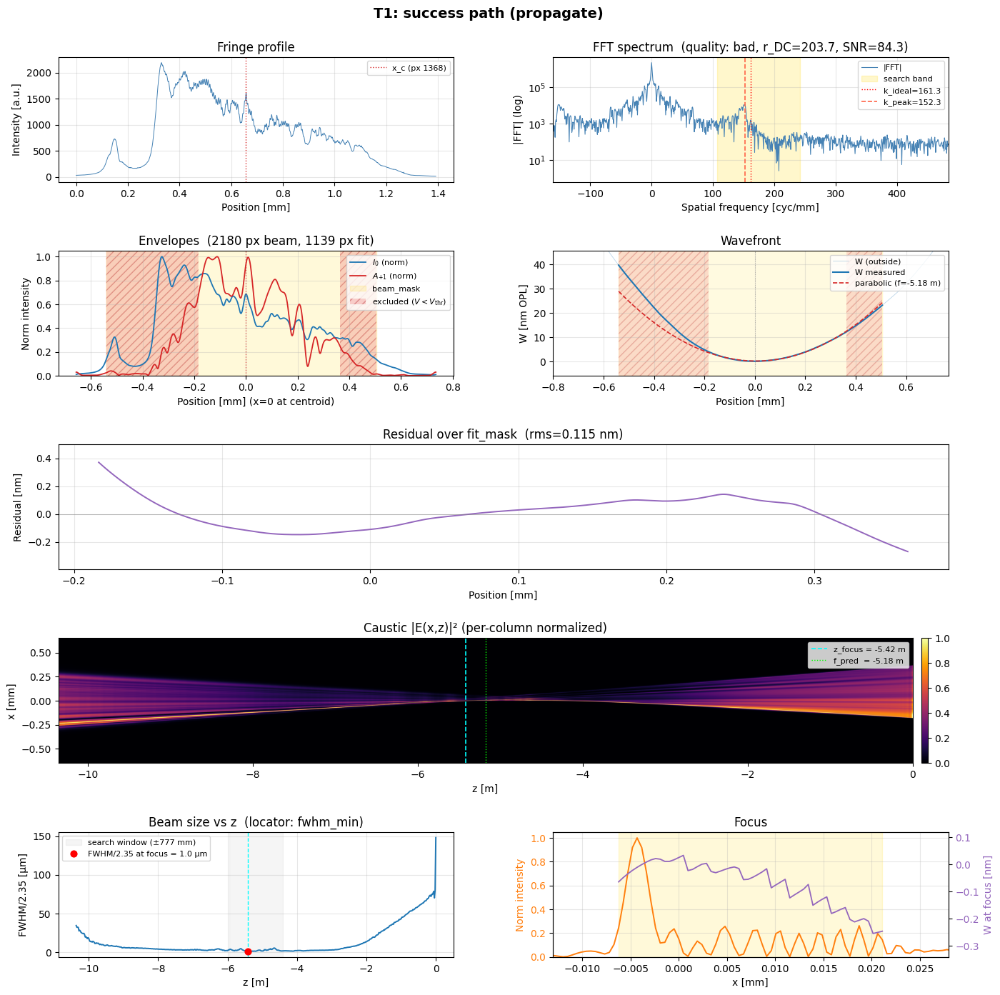

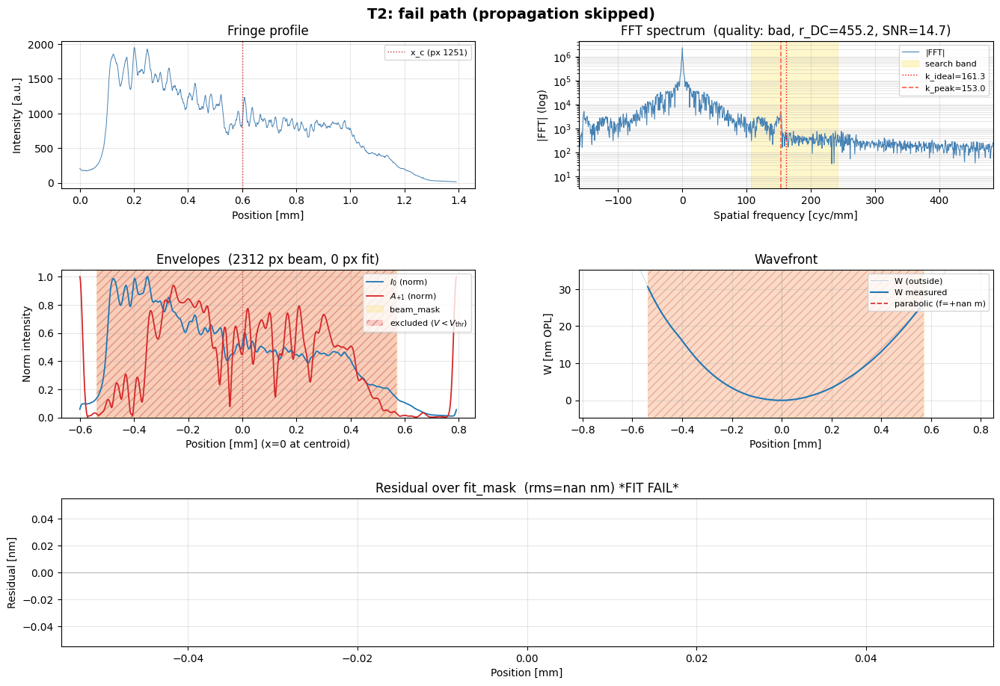

In [173]:
import importlib
import wfs_live as wfl
importlib.reload(wfl)
# Re-run reco_frame definition cell if it imports reconstruct_single by name.

# --- Test 1: success path (regression) ---
print("=== T1: success path ===")
r1 = reco_frame('chip2_grid_neg', 67, propagate=True)
print(f"fit_status   : {r1['fit_status']}")
print(f"rms_resid_nm : {r1['rms_resid_nm']:.3f}  (expect 0.115)")
print(f"z_focus      : {r1['z_focus']:+.3f} m")
print(f"'z_focus' in r: {'z_focus' in r1}  (expect True)")

# --- Test 2: fail path ---
print("\n=== T2: fail path ===")
r2 = reco_frame('chip2_grid_neg', 0, V_threshold=0.5, propagate=True, verbose=True)
print(f"fit_status     : {r2['fit_status']}")
print(f"fit_fail_reason: {r2['fit_fail_reason']}")
print(f"f_pred         : {r2['f_pred']}")
print(f"'z_focus' in r : {'z_focus' in r2}   (expect False)")
print(f"W_rad has NaN  : {np.any(np.isnan(r2['W_rad']))}  (expect False)")

# Plot both
print("\n=== plots ===")
_ = wfl.plot_result(r1, title='T1: success path (propagate)')
_ = wfl.plot_result(r2, title='T2: fail path (propagation skipped)')

### Decisions

Lock recalibrated thresholds, V_thr, and per-scan usable sub-regions.

# NOTES
